In [ ]:
pip install torch

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install torchvision

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 1.8 MB 3.6 MB/s eta 0:00:01
     |████████████████████████████████| 5.3 MB 10.4 MB/s eta 0:00:01
     |████████████████████████████████| 3.0 MB 15.7 MB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])


trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)


batch_size = 64
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)


device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")


Files already downloaded and verified
Files already downloaded and verified


In [ ]:
device

device(type='mps')

In [ ]:
pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 7.8 MB 2.7 MB/s eta 0:00:01
     |████████████████████████████████| 64 kB 5.7 MB/s eta 0:00:01
     |████████████████████████████████| 106 kB 13.1 MB/s eta 0:00:01
     |████████████████████████████████| 2.3 MB 8.9 MB/s eta 0:00:01
     |████████████████████████████████| 249 kB 11.6 MB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


Matplotlib is building the font cache; this may take a moment.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.71453285..1.8768656].


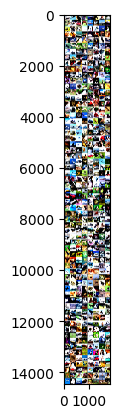

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


def imshow(img):
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


dataiter = iter(trainloader)

images, labels = next(dataiter)


imshow(torchvision.utils.make_grid(images))



In [ ]:
pip install sklearn

Defaulting to user installation because normal site-packages is not writeable
    ERROR: Command errored out with exit status 1:
     command: /Library/Developer/CommandLineTools/usr/bin/python3 -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/pip-install-2tosyumi/sklearn_577eea34da014298b2d0371eef4c1267/setup.py'"'"'; __file__='"'"'/private/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/pip-install-2tosyumi/sklearn_577eea34da014298b2d0371eef4c1267/setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' egg_info --egg-base /private/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/pip-pip-egg-info-91p1gos2
         cwd: /private/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/pip-install-2tosyumi/sklea

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np

device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]
weight_decays = [0, 1e-4, 1e-3]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(model.fc.in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)


    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()


            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%")


    model.eval()
    correct_val = 0
    total_val = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()

    val_accuracy = 100 * correct_val / total_val
    return train_accuracy, val_accuracy


best_accuracy = 0
best_params = {}

for lr in learning_rates:
    for wd in weight_decays:
        print(f"\nTesting Learning Rate: {lr}, Weight Decay: {wd}")
        accuracies = []
        train_accuracies = []

        for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
            print(f"Fold {fold+1}/{k_folds}")


            train_subset = Subset(dataset, train_idx)
            val_subset = Subset(dataset, val_idx)
            train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


            train_accuracy, val_accuracy = train_validate_model(train_loader, val_loader, lr, wd)
            train_accuracies.append(train_accuracy)
            accuracies.append(val_accuracy)
            print(f"Fold {fold+1} - Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")

        avg_train_accuracy = np.mean(train_accuracies)
        avg_val_accuracy = np.mean(accuracies)
        print(f"Average Training Accuracy for Learning Rate {lr}, Weight Decay {wd}: {avg_train_accuracy:.2f}%")
        print(f"Average Validation Accuracy for Learning Rate {lr}, Weight Decay {wd}: {avg_val_accuracy:.2f}%\n")


        if avg_val_accuracy > best_accuracy:
            best_accuracy = avg_val_accuracy
            best_params = {'learning_rate': lr, 'weight_decay': wd}

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}, Weight Decay: {best_params['weight_decay']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")



Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001, Weight Decay: 0
Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 48.06%
Epoch [2/5], Training Accuracy: 63.81%
Epoch [3/5], Training Accuracy: 70.31%
Epoch [4/5], Training Accuracy: 74.66%
Epoch [5/5], Training Accuracy: 78.42%
Fold 1 - Training Accuracy: 78.42%, Validation Accuracy: 73.30%
Fold 2/5
Epoch [1/5], Training Accuracy: 48.84%
Epoch [2/5], Training Accuracy: 63.67%
Epoch [3/5], Training Accuracy: 70.43%
Epoch [4/5], Training Accuracy: 74.71%
Epoch [5/5], Training Accuracy: 78.59%
Fold 2 - Training Accuracy: 78.59%, Validation Accuracy: 70.59%
Fold 3/5
Epoch [1/5], Training Accuracy: 47.91%
Epoch [2/5], Training Accuracy: 63.58%
Epoch [3/5], Training Accuracy: 69.58%
Epoch [4/5], Training Accuracy: 74.37%
Epoch [5/5], Training Accuracy: 78.50%
Fold 3 - Training Accuracy: 78.50%, Validation Accuracy: 72.50%
Fold 4/5
Epoch [1/5], Training Accuracy: 48.16%
Epoch [2/5], Training Accuracy: 63.37%
Epoch [3/5], Training Accuracy: 70.17%
Epoch [4/5], Training Accuracy: 73.98%
Epoch [5/5], Training Accuracy: 78.19%
F

Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001, Weight Decay: 0
Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 48.19%, Validation Accuracy: 58.02%
Training Loss: 1.4436, Validation Loss: 1.1767
Epoch [2/5], Training Accuracy: 63.46%, Validation Accuracy: 63.83%
Training Loss: 1.0364, Validation Loss: 1.0441
Epoch [3/5], Training Accuracy: 70.02%, Validation Accuracy: 68.79%
Training Loss: 0.8570, Validation Loss: 0.8835
Epoch [4/5], Training Accuracy: 74.63%, Validation Accuracy: 70.07%
Training Loss: 0.7290, Validation Loss: 0.9062
Epoch [5/5], Training Accuracy: 78.64%, Validation Accuracy: 73.25%
Training Loss: 0.6143, Validation Loss: 0.7868
Fold 2/5
Epoch [1/5], Training Accuracy: 48.56%, Validation Accuracy: 53.77%
Training Loss: 1.4340, Validation Loss: 1.3092
Epoch [2/5], Training Accuracy: 63.62%, Validation Accuracy: 64.17%
Training Loss: 1.0364, Validation Loss: 1.0234
Epoch [3/5], Training Accuracy: 70.43%, Validation Accuracy: 69.97%
Training Loss: 0.8477, Validation Loss: 0.8528
Epoch [4/5], Training Accuracy: 74.66%, Validation Accuracy: 71.59%
Tra

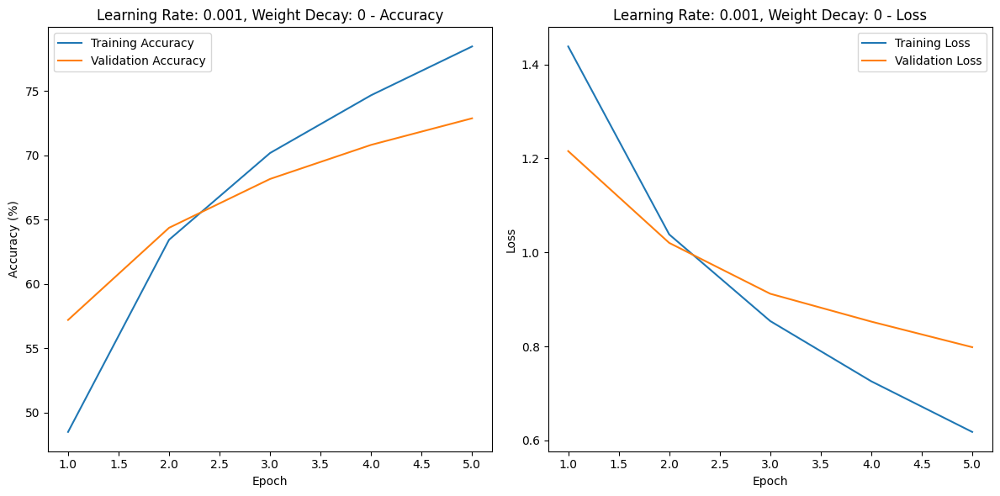

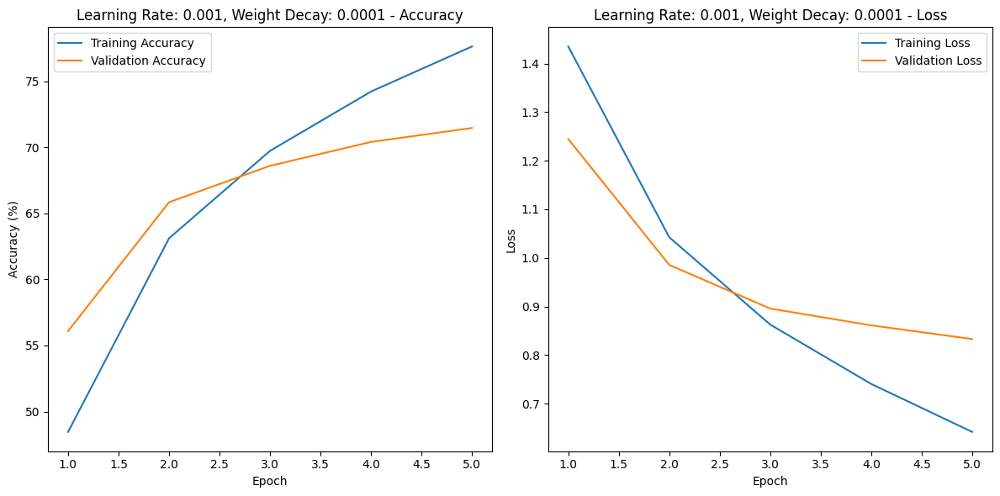

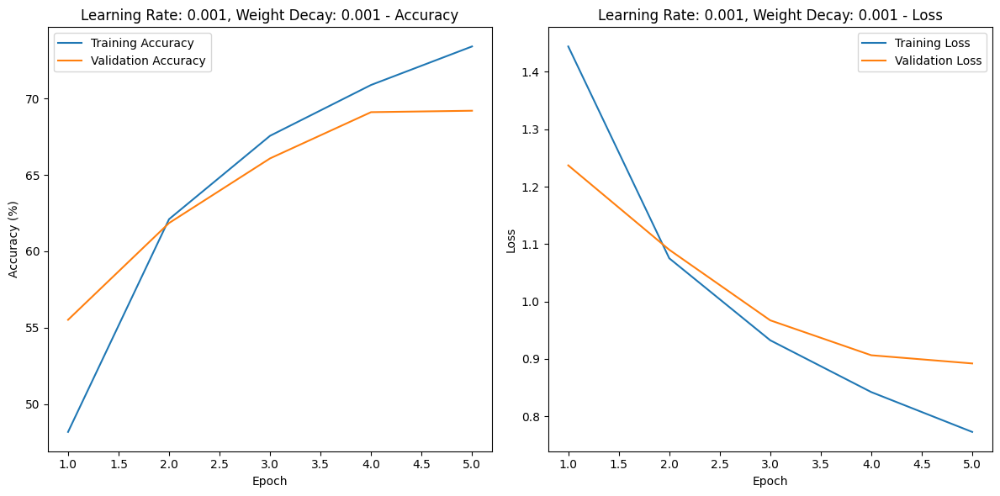

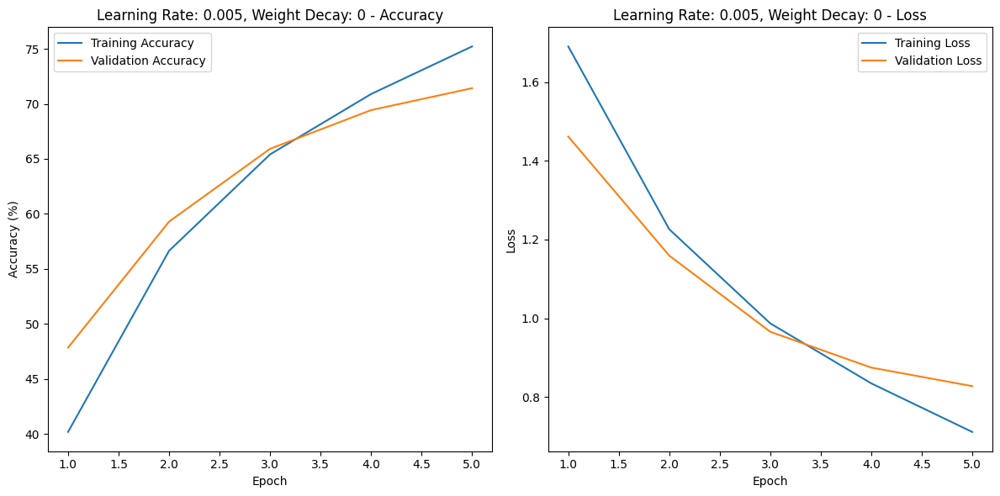

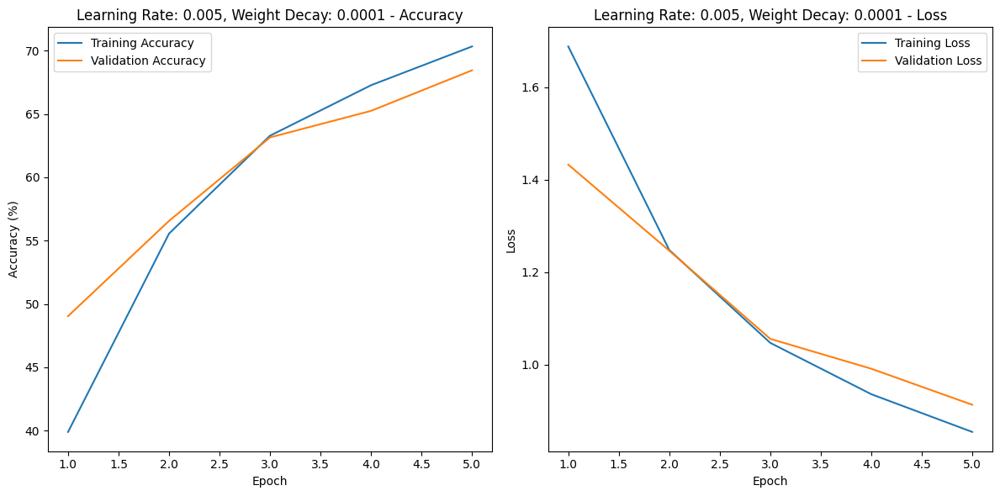

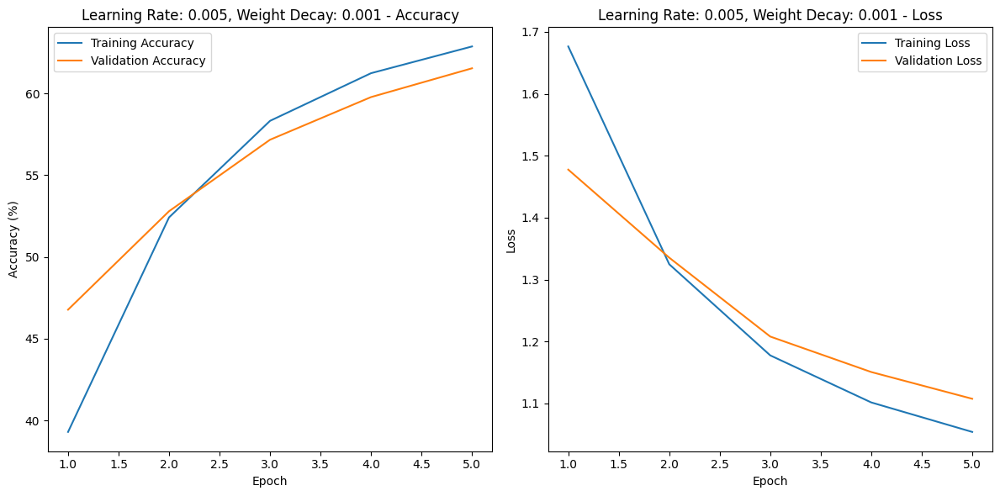

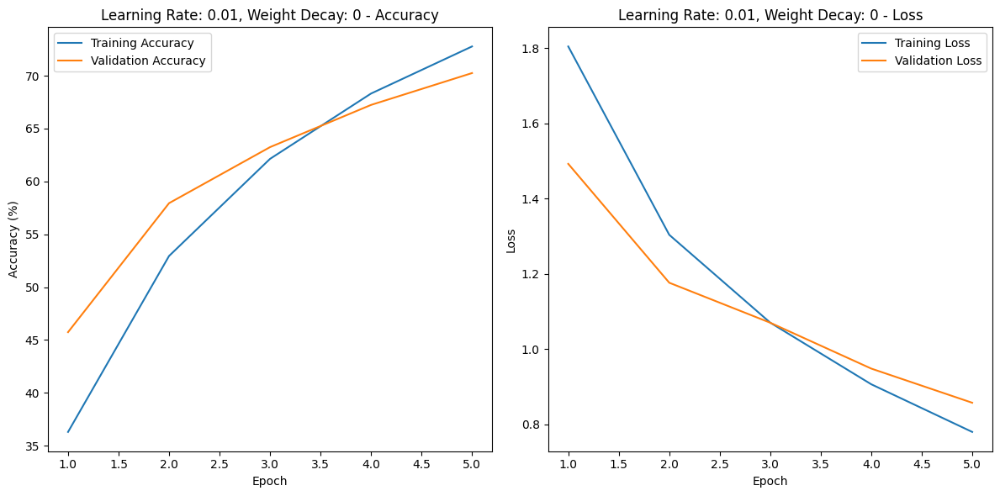

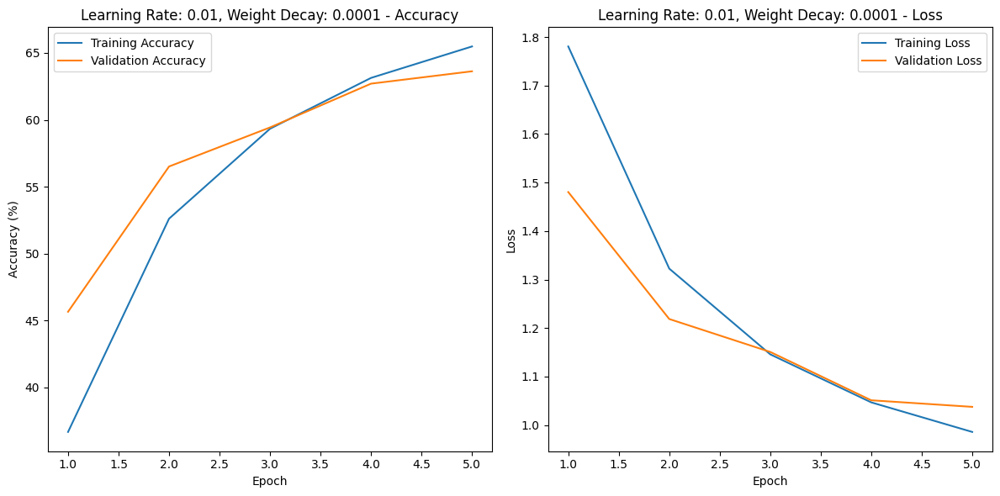

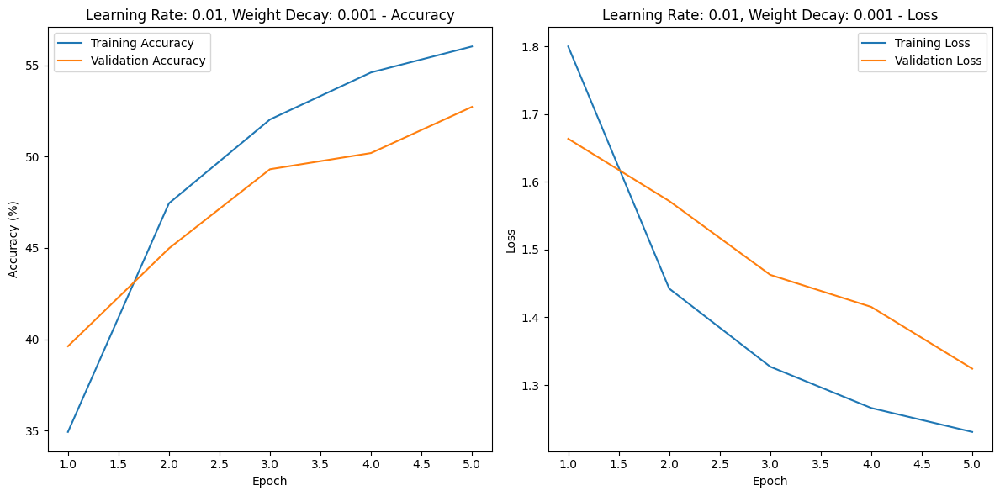

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]
weight_decays = [0, 1e-4, 1e-3]

kfold = KFold(n_splits=k_folds, shuffle=True)


results = {}


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(model.fc.in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses


for lr in learning_rates:
    for wd in weight_decays:
        print(f"\nTesting Learning Rate: {lr}, Weight Decay: {wd}")
        fold_train_accuracies, fold_val_accuracies = [], []
        fold_train_losses, fold_val_losses = [], []

        for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
            print(f"Fold {fold+1}/{k_folds}")

            train_subset = Subset(dataset, train_idx)
            val_subset = Subset(dataset, val_idx)
            train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)

            train_acc, val_acc, train_loss, val_loss = train_validate_model(train_loader, val_loader, lr, wd)
            fold_train_accuracies.append(train_acc)
            fold_val_accuracies.append(val_acc)
            fold_train_losses.append(train_loss)
            fold_val_losses.append(val_loss)


        avg_train_acc = np.mean(fold_train_accuracies, axis=0)
        avg_val_acc = np.mean(fold_val_accuracies, axis=0)
        avg_train_loss = np.mean(fold_train_losses, axis=0)
        avg_val_loss = np.mean(fold_val_losses, axis=0)

        results[(lr, wd)] = {
            'train_accuracy': avg_train_acc,
            'val_accuracy': avg_val_acc,
            'train_loss': avg_train_loss,
            'val_loss': avg_val_loss,
        }


for (lr, wd), metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label='Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'Learning Rate: {lr}, Weight Decay: {wd} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label='Training Loss')
    plt.plot(epochs, metrics['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Learning Rate: {lr}, Weight Decay: {wd} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Now applying Resnet-18 with data augmentation and L2 regularization.

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_val = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]
weight_decays = [1e-4, 1e-3, 1e-2]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(model.fc.in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train


        model.eval()
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")

    return best_model_state, best_val_accuracy


best_accuracy = 0
best_params = {}
best_model_path = 'best_resnet18_augmented_model.pth'

for lr in learning_rates:
    for wd in weight_decays:
        print(f"\nTesting Learning Rate: {lr}, Weight Decay: {wd}")
        fold_accuracies = []

        for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
            print(f"Fold {fold+1}/{k_folds}")


            train_subset = Subset(dataset, train_idx)
            val_subset = Subset(dataset, val_idx)


            train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


            model_state, val_accuracy = train_validate_model(train_loader, val_loader, lr, wd)
            fold_accuracies.append(val_accuracy)

            print(f"Fold {fold+1} - Validation Accuracy: {val_accuracy:.2f}%")

        avg_val_accuracy = np.mean(fold_accuracies)
        print(f"Average Validation Accuracy for Learning Rate {lr}, Weight Decay {wd}: {avg_val_accuracy:.2f}%\n")


        if avg_val_accuracy > best_accuracy:
            best_accuracy = avg_val_accuracy
            best_params = {'learning_rate': lr, 'weight_decay': wd}
            torch.save(model_state, best_model_path)
            print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}, Weight Decay: {best_params['weight_decay']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")


Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001, Weight Decay: 0.0001
Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 40.51%, Validation Accuracy: 46.90%
Epoch [2/5], Training Accuracy: 53.76%, Validation Accuracy: 55.70%
Epoch [3/5], Training Accuracy: 60.85%, Validation Accuracy: 60.49%
Epoch [4/5], Training Accuracy: 64.79%, Validation Accuracy: 66.90%
Epoch [5/5], Training Accuracy: 67.98%, Validation Accuracy: 69.17%
Fold 1 - Validation Accuracy: 69.17%
Fold 2/5
Epoch [1/5], Training Accuracy: 41.38%, Validation Accuracy: 50.79%
Epoch [2/5], Training Accuracy: 55.42%, Validation Accuracy: 58.05%
Epoch [3/5], Training Accuracy: 61.30%, Validation Accuracy: 60.92%
Epoch [4/5], Training Accuracy: 65.21%, Validation Accuracy: 65.26%
Epoch [5/5], Training Accuracy: 68.00%, Validation Accuracy: 66.83%
Fold 2 - Validation Accuracy: 66.83%
Fold 3/5
Epoch [1/5], Training Accuracy: 42.30%, Validation Accuracy: 48.72%
Epoch [2/5], Training Accuracy: 55.86%, Validation Accuracy: 55.66%
Epoch [3/5], Training Accuracy: 61.78%, Validation Accuracy: 62.29%
Epoch [4/5], Training Ac

In [ ]:
#Graphs

Using device: mps
Files already downloaded and verified

Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 42.16%, Validation Accuracy: 48.50%
Training Loss: 1.5957, Validation Loss: 1.4529
Epoch [2/5], Training Accuracy: 54.56%, Validation Accuracy: 56.38%
Training Loss: 1.2634, Validation Loss: 1.2478
Epoch [3/5], Training Accuracy: 60.87%, Validation Accuracy: 63.25%
Training Loss: 1.1061, Validation Loss: 1.0348
Epoch [4/5], Training Accuracy: 65.22%, Validation Accuracy: 64.76%
Training Loss: 0.9963, Validation Loss: 1.0219
Epoch [5/5], Training Accuracy: 67.36%, Validation Accuracy: 68.21%
Training Loss: 0.9304, Validation Loss: 0.9041

Fold 2/5
Epoch [1/5], Training Accuracy: 41.72%, Validation Accuracy: 47.79%
Training Loss: 1.5913, Validation Loss: 1.4357
Epoch [2/5], Training Accuracy: 55.57%, Validation Accuracy: 57.25%
Training Loss: 1.2422, Validation Loss: 1.2026
Epoch [3/5], Training Accuracy: 61.39%, Validation Accuracy: 59.89%
Training Loss: 1.0840, Validation Loss: 1.1209
Epoch [4/5], Training Accuracy: 65.70%, Validation Accuracy: 64.99%
Tr

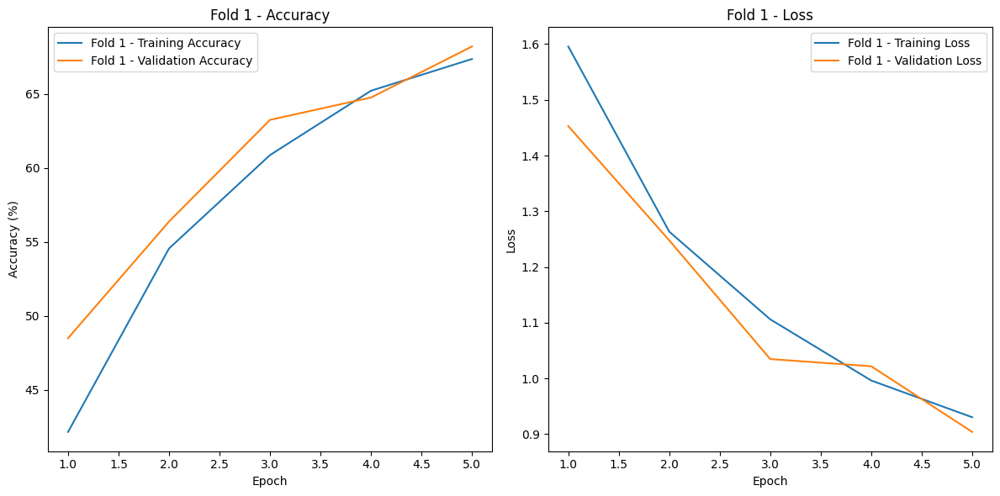

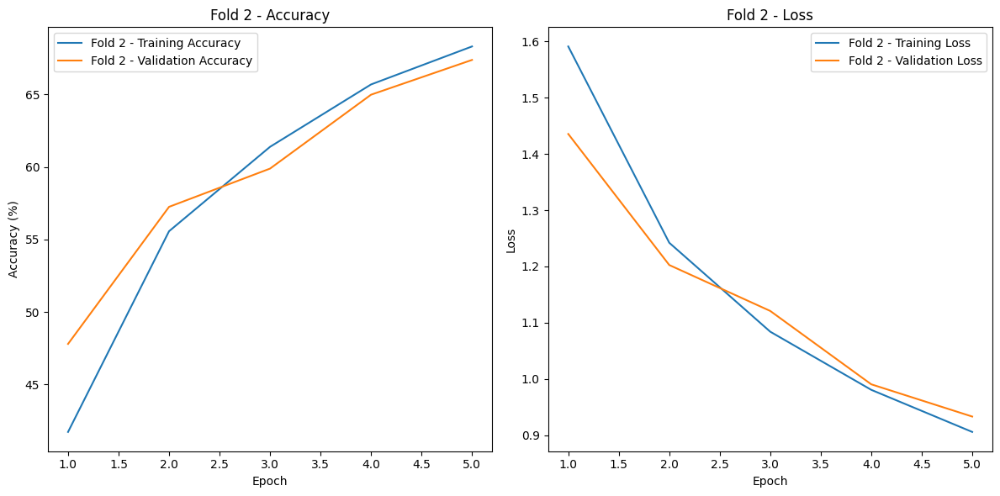

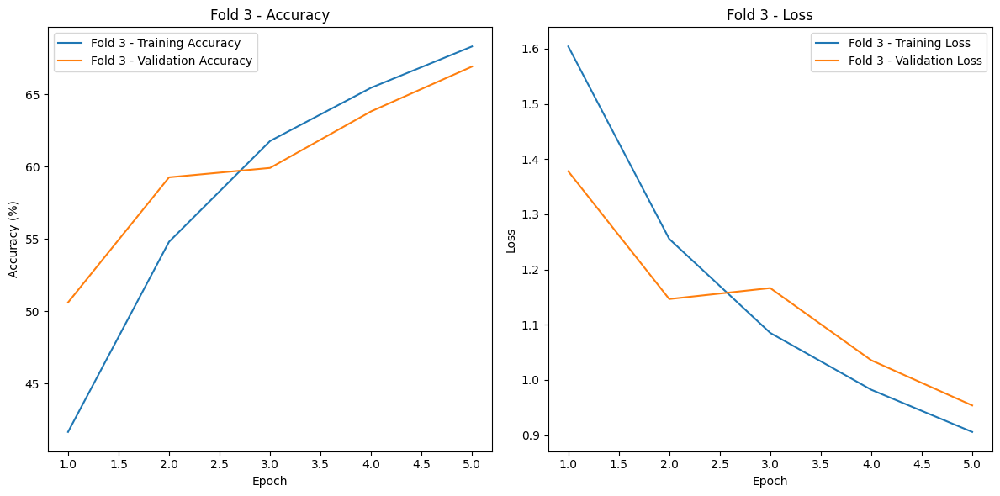

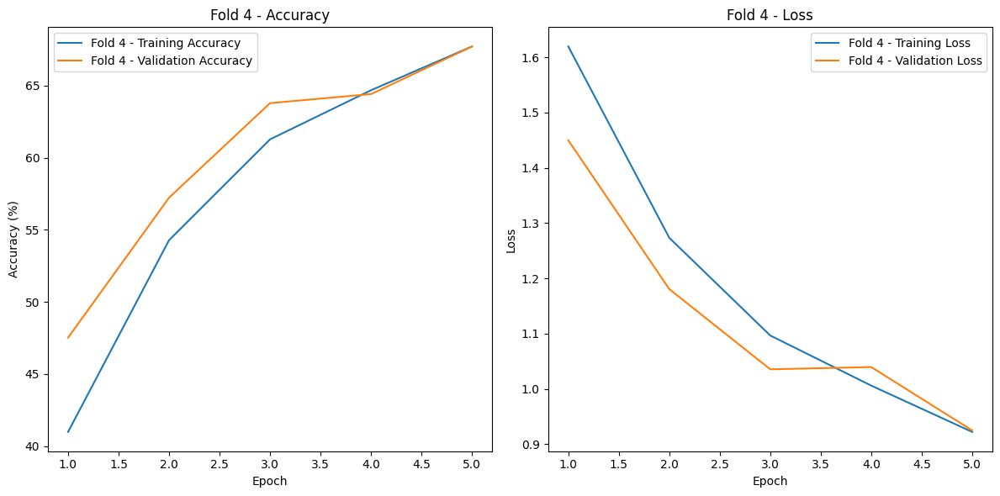

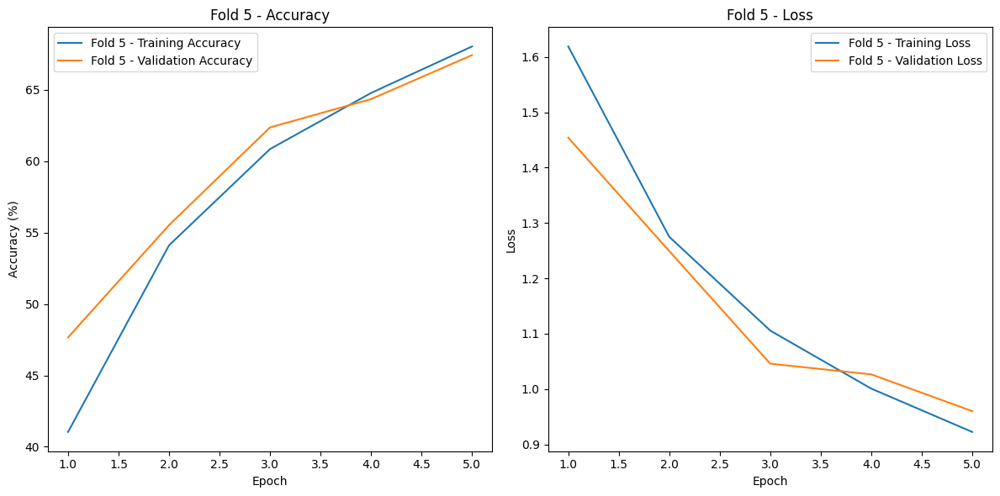

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_val = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rate = 0.001
weight_decay = 1e-4


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(model.fc.in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses


results = {}

for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
    print(f"\nFold {fold+1}/{k_folds}")

    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)

    train_acc, val_acc, train_loss, val_loss = train_validate_model(train_loader, val_loader, learning_rate, weight_decay)


    results[fold] = {
        'train_accuracy': train_acc,
        'val_accuracy': val_acc,
        'train_loss': train_loss,
        'val_loss': val_loss,
    }


for fold, metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label=f'Fold {fold+1} - Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label=f'Fold {fold+1} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'Fold {fold+1} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label=f'Fold {fold+1} - Training Loss')
    plt.plot(epochs, metrics['val_loss'], label=f'Fold {fold+1} - Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold+1} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Testing accuracy for data aug and l2 regularization

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = 'best_resnet18_augmented_model.pth'
model = models.resnet18(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()


def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1179/2264053412.py:28: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_p

Test Accuracy: 70.23%


In [ ]:
#Applying Resnet-18 without L2 and without data augmentation

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(model.fc.in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train


        model.eval()
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")

    return best_model_state, best_val_accuracy


best_accuracy = 0
best_params = {}
best_model_path = 'best_resnet18_no_aug_no_l2_model.pth'

for lr in learning_rates:
    print(f"\nTesting Learning Rate: {lr}")
    fold_accuracies = []

    for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
        print(f"Fold {fold+1}/{k_folds}")


        train_subset = Subset(dataset, train_idx)
        val_subset = Subset(dataset, val_idx)


        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


        model_state, val_accuracy = train_validate_model(train_loader, val_loader, lr)
        fold_accuracies.append(val_accuracy)

        print(f"Fold {fold+1} - Validation Accuracy: {val_accuracy:.2f}%")

    avg_val_accuracy = np.mean(fold_accuracies)
    print(f"Average Validation Accuracy for Learning Rate {lr}: {avg_val_accuracy:.2f}%\n")


    if avg_val_accuracy > best_accuracy:
        best_accuracy = avg_val_accuracy
        best_params = {'learning_rate': lr}
        torch.save(model_state, best_model_path)
        print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")


Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001
Fold 1/5
Epoch [1/5], Training Accuracy: 48.27%, Validation Accuracy: 56.46%
Epoch [2/5], Training Accuracy: 63.38%, Validation Accuracy: 65.48%
Epoch [3/5], Training Accuracy: 70.11%, Validation Accuracy: 68.02%
Epoch [4/5], Training Accuracy: 74.53%, Validation Accuracy: 71.54%
Epoch [5/5], Training Accuracy: 78.70%, Validation Accuracy: 71.89%
Fold 1 - Validation Accuracy: 71.89%
Fold 2/5
Epoch [1/5], Training Accuracy: 48.07%, Validation Accuracy: 57.14%
Epoch [2/5], Training Accuracy: 63.02%, Validation Accuracy: 64.77%
Epoch [3/5], Training Accuracy: 70.00%, Validation Accuracy: 69.53%
Epoch [4/5], Training Accuracy: 74.81%, Validation Accuracy: 71.84%
Epoch [5/5], Training Accuracy: 78.41%, Validation Accuracy: 72.36%
Fold 2 - Validation Accuracy: 72.36%
Fold 3/5
Epoch [1/5], Training Accuracy: 48.47%, Validation Accuracy: 54.26%
Epoch [2/5], Training Accuracy: 64.13%, Validation Accuracy: 63.7

In [ ]:
#Graphs

Using device: mps
Files already downloaded and verified

Fold 1/5
Epoch [1/5], Training Accuracy: 48.43%, Validation Accuracy: 56.07%
Training Loss: 1.4418, Validation Loss: 1.2607
Epoch [2/5], Training Accuracy: 63.20%, Validation Accuracy: 65.32%
Training Loss: 1.0383, Validation Loss: 0.9904
Epoch [3/5], Training Accuracy: 70.13%, Validation Accuracy: 68.15%
Training Loss: 0.8590, Validation Loss: 0.9080
Epoch [4/5], Training Accuracy: 74.99%, Validation Accuracy: 71.68%
Training Loss: 0.7212, Validation Loss: 0.8230
Epoch [5/5], Training Accuracy: 78.75%, Validation Accuracy: 73.12%
Training Loss: 0.6088, Validation Loss: 0.7820

Fold 2/5
Epoch [1/5], Training Accuracy: 48.88%, Validation Accuracy: 58.43%
Training Loss: 1.4273, Validation Loss: 1.1784
Epoch [2/5], Training Accuracy: 63.60%, Validation Accuracy: 67.93%
Training Loss: 1.0341, Validation Loss: 0.9181
Epoch [3/5], Training Accuracy: 70.36%, Validation Accuracy: 68.94%
Training Loss: 0.8453, Validation Loss: 0.8953
Epoc

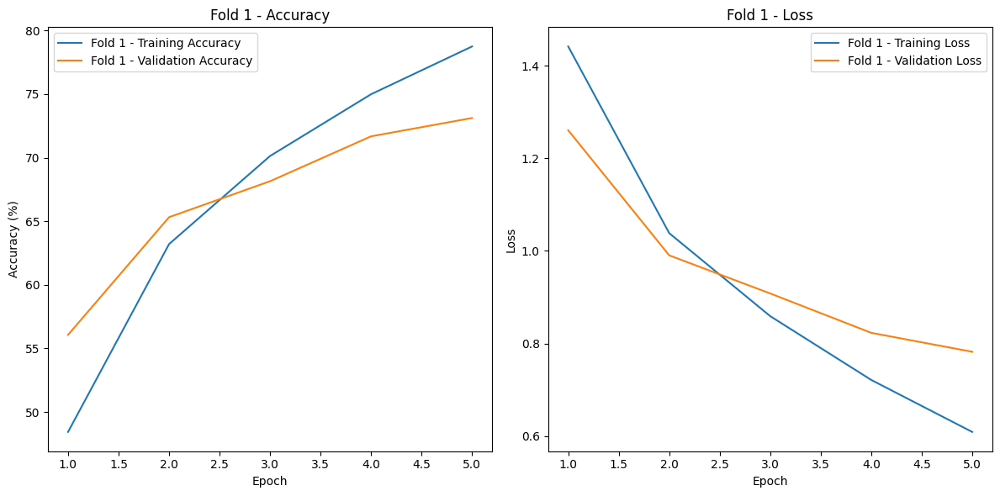

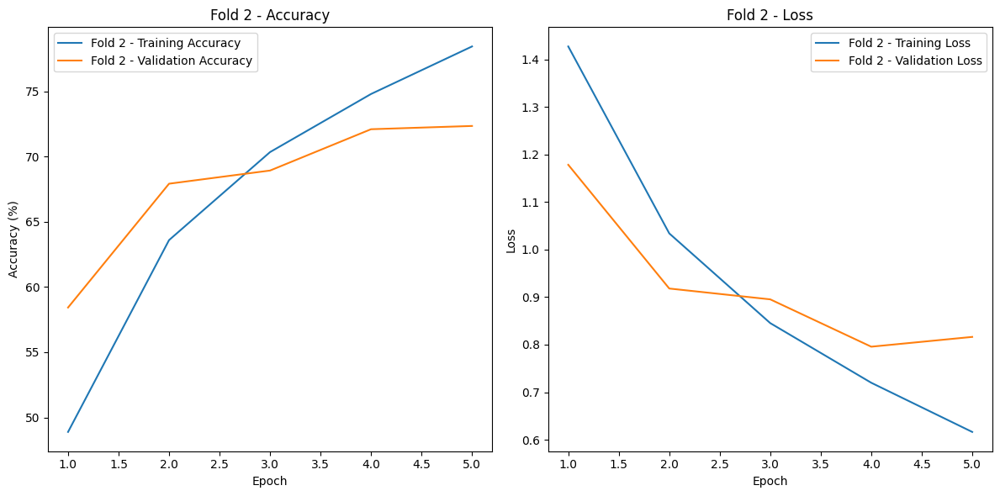

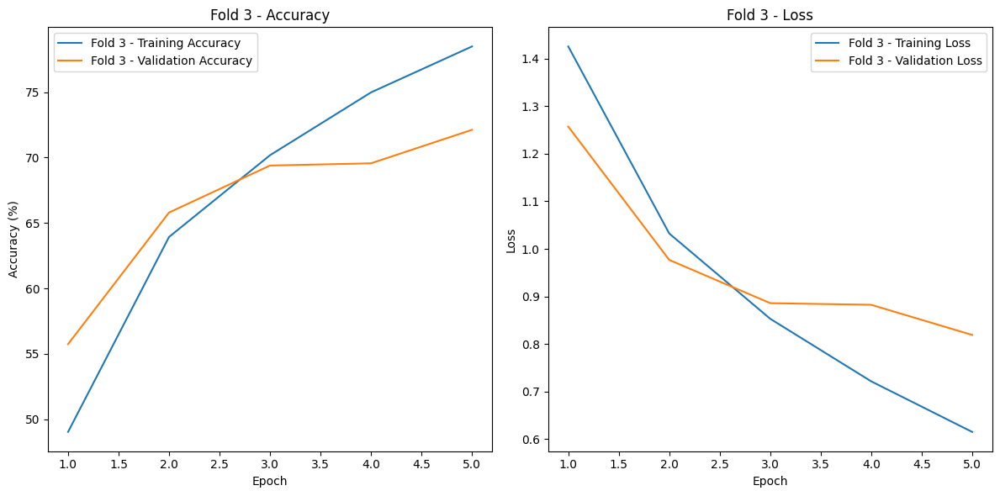

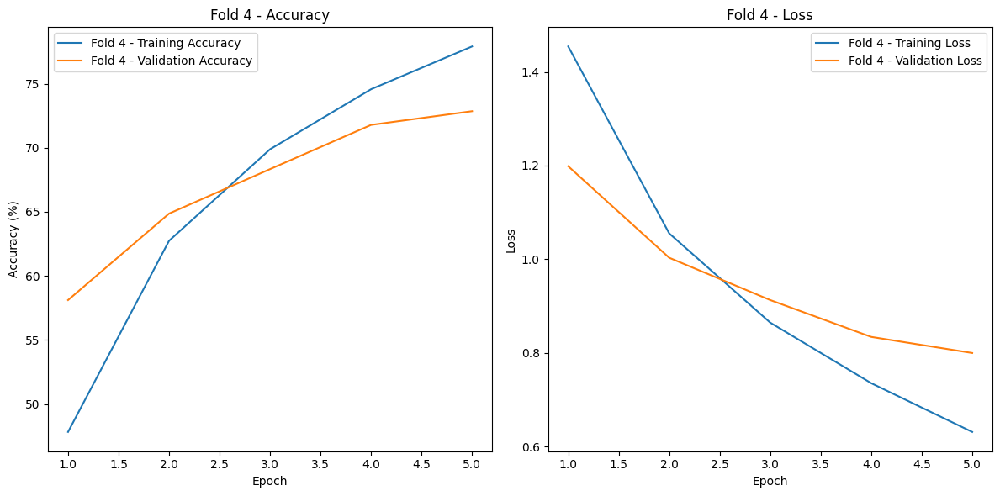

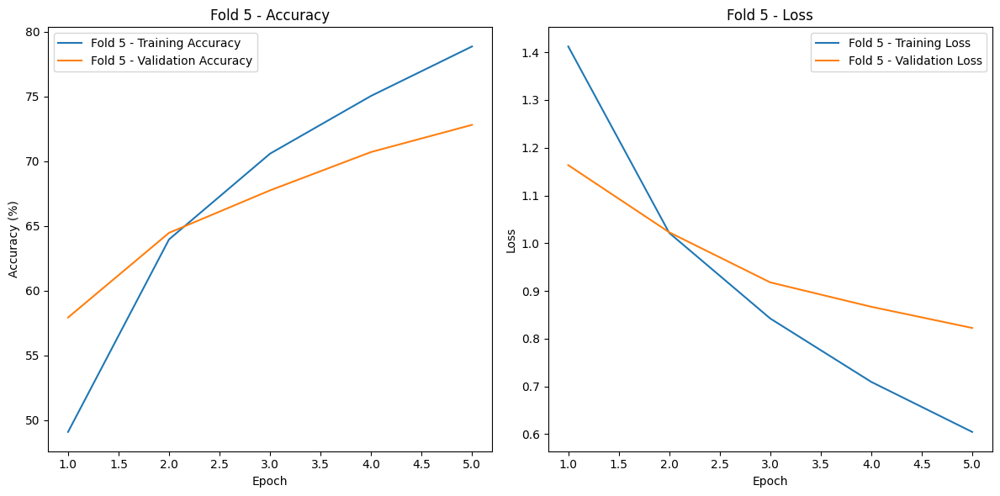

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rate = 0.001


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(model.fc.in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses


results = {}

for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
    print(f"\nFold {fold+1}/{k_folds}")

    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)

    train_acc, val_acc, train_loss, val_loss = train_validate_model(train_loader, val_loader, learning_rate)


    results[fold] = {
        'train_accuracy': train_acc,
        'val_accuracy': val_acc,
        'train_loss': train_loss,
        'val_loss': val_loss,
    }


for fold, metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label=f'Fold {fold+1} - Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label=f'Fold {fold+1} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'Fold {fold+1} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label=f'Fold {fold+1} - Training Loss')
    plt.plot(epochs, metrics['val_loss'], label=f'Fold {fold+1} - Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold+1} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Testing

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = 'best_resnet18_no_aug_no_l2_model.pth'
model = models.resnet18(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()

def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1179/3476780711.py:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_p

Test Accuracy: 71.30%


In [ ]:
#Model- Alexnet

In [ ]:
#Alexnet with L2 regularization
#Image resizing was needed

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]
weight_decays = [1e-4, 1e-3, 1e-2]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.alexnet(pretrained=False)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train


        model.eval()
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")

    return best_model_state, best_val_accuracy


best_accuracy = 0
best_params = {}
best_model_path = 'best_alexnet_no_aug_with_l2_model.pth'

for lr in learning_rates:
    for wd in weight_decays:
        print(f"\nTesting Learning Rate: {lr}, Weight Decay: {wd}")
        fold_accuracies = []

        for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
            print(f"Fold {fold+1}/{k_folds}")


            train_subset = Subset(dataset, train_idx)
            val_subset = Subset(dataset, val_idx)


            train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


            model_state, val_accuracy = train_validate_model(train_loader, val_loader, lr, wd)
            fold_accuracies.append(val_accuracy)

            print(f"Fold {fold+1} - Validation Accuracy: {val_accuracy:.2f}%")

        avg_val_accuracy = np.mean(fold_accuracies)
        print(f"Average Validation Accuracy for Learning Rate {lr}, Weight Decay {wd}: {avg_val_accuracy:.2f}%\n")


        if avg_val_accuracy > best_accuracy:
            best_accuracy = avg_val_accuracy
            best_params = {'learning_rate': lr, 'weight_decay': wd}
            torch.save(model_state, best_model_path)
            print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}, Weight Decay: {best_params['weight_decay']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")


Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001, Weight Decay: 0.0001
Fold 1/5
Epoch [1/5], Training Accuracy: 34.06%, Validation Accuracy: 44.77%
Epoch [2/5], Training Accuracy: 47.24%, Validation Accuracy: 53.83%
Epoch [3/5], Training Accuracy: 53.36%, Validation Accuracy: 58.68%
Epoch [4/5], Training Accuracy: 57.92%, Validation Accuracy: 59.96%
Epoch [5/5], Training Accuracy: 60.93%, Validation Accuracy: 63.24%
Fold 1 - Validation Accuracy: 63.24%
Fold 2/5
Epoch [1/5], Training Accuracy: 31.23%, Validation Accuracy: 44.36%
Epoch [2/5], Training Accuracy: 45.56%, Validation Accuracy: 48.77%
Epoch [3/5], Training Accuracy: 51.58%, Validation Accuracy: 56.53%
Epoch [4/5], Training Accuracy: 55.68%, Validation Accuracy: 58.22%
Epoch [5/5], Training Accuracy: 58.58%, Validation Accuracy: 60.53%
Fold 2 - Validation Accuracy: 60.53%
Fold 3/5
Epoch [1/5], Training Accuracy: 32.79%, Validation Accuracy: 44.55%
Epoch [2/5], Training Accuracy: 45.96%, Val

In [ ]:
#Graphs

Using device: mps
Files already downloaded and verified

Fold 1/5
Epoch [1/5], Training Accuracy: 32.82%, Validation Accuracy: 42.43%
Training Loss: 1.8152, Validation Loss: 1.5188
Epoch [2/5], Training Accuracy: 46.34%, Validation Accuracy: 52.19%
Training Loss: 1.4670, Validation Loss: 1.3336
Epoch [3/5], Training Accuracy: 52.20%, Validation Accuracy: 56.75%
Training Loss: 1.3256, Validation Loss: 1.2180
Epoch [4/5], Training Accuracy: 55.99%, Validation Accuracy: 57.82%
Training Loss: 1.2307, Validation Loss: 1.2099
Epoch [5/5], Training Accuracy: 59.07%, Validation Accuracy: 60.88%
Training Loss: 1.1549, Validation Loss: 1.1041

Fold 2/5
Epoch [1/5], Training Accuracy: 29.04%, Validation Accuracy: 40.65%
Training Loss: 1.9057, Validation Loss: 1.5958
Epoch [2/5], Training Accuracy: 45.22%, Validation Accuracy: 49.28%
Training Loss: 1.5054, Validation Loss: 1.3906
Epoch [3/5], Training Accuracy: 50.86%, Validation Accuracy: 53.89%
Training Loss: 1.3606, Validation Loss: 1.2741
Epoc

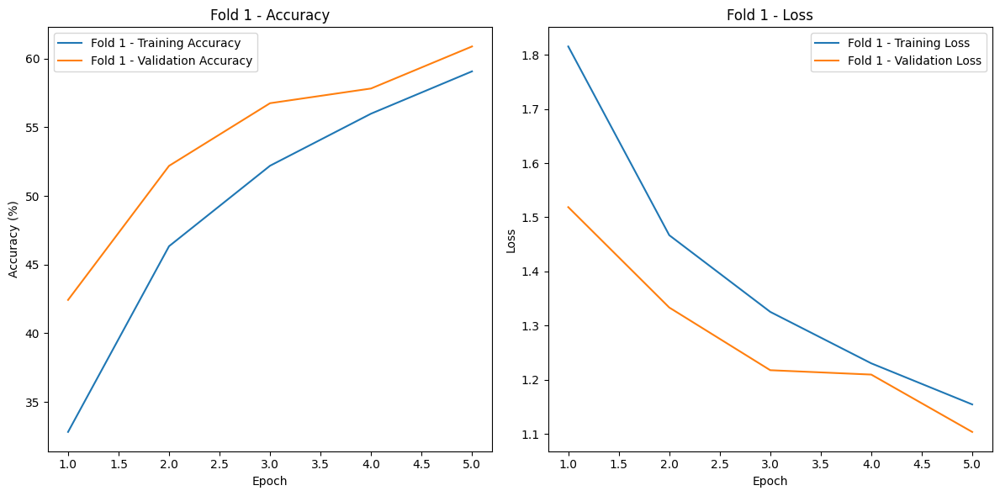

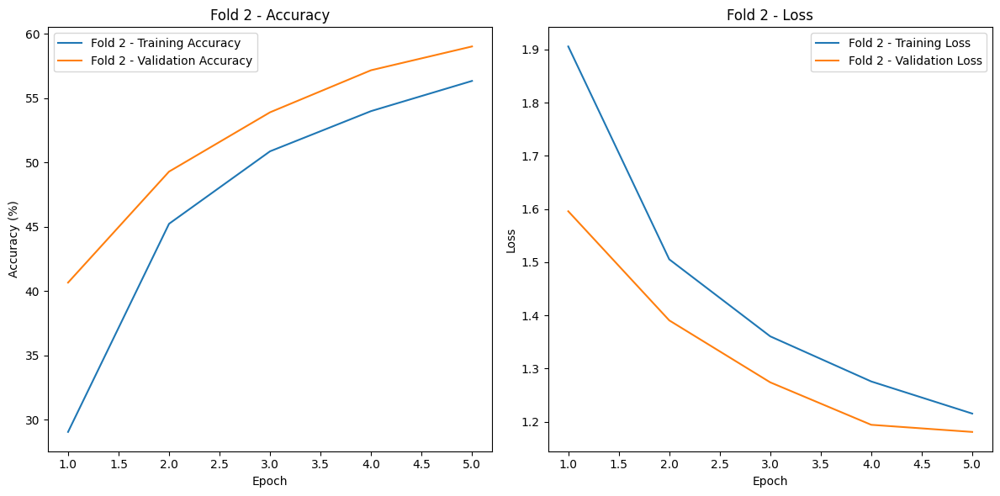

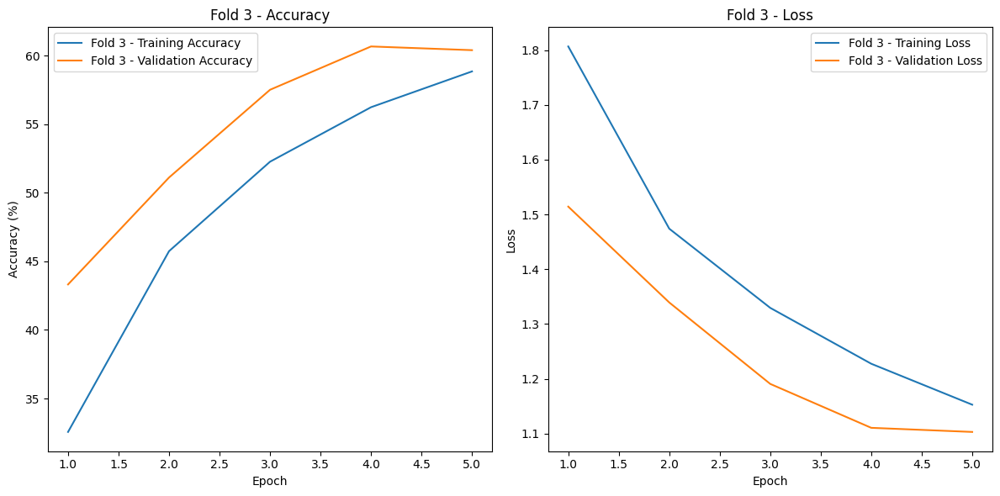

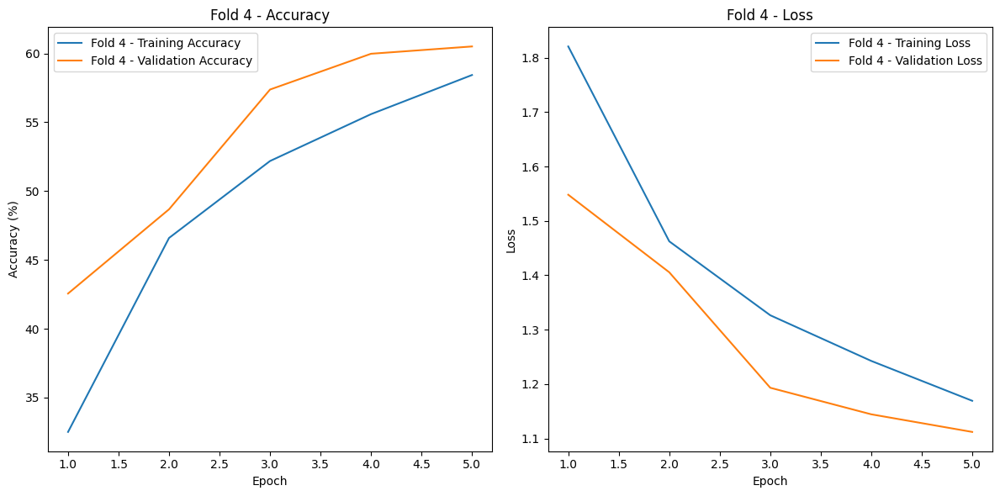

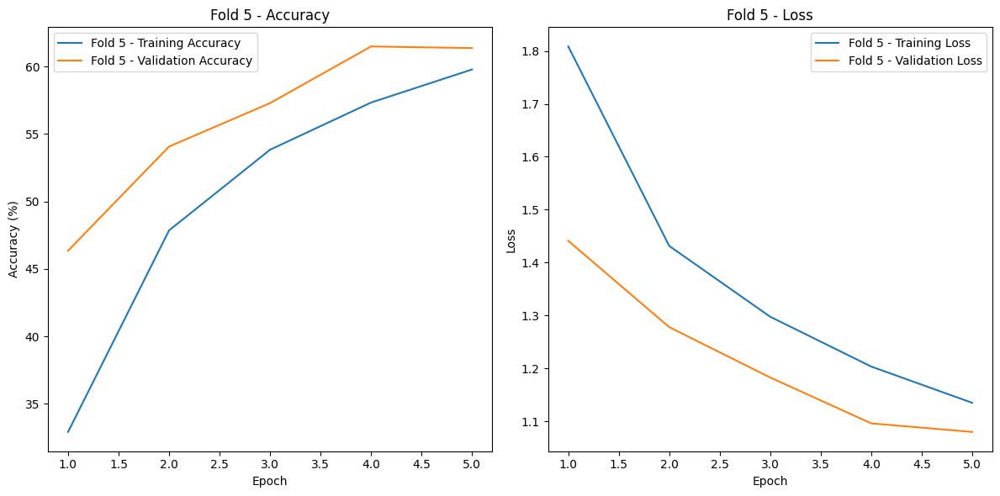

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rate = 0.001
weight_decay = 1e-4


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.alexnet(pretrained=False)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses


results = {}

for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
    print(f"\nFold {fold+1}/{k_folds}")

    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)

    train_acc, val_acc, train_loss, val_loss = train_validate_model(train_loader, val_loader, learning_rate, weight_decay)


    results[fold] = {
        'train_accuracy': train_acc,
        'val_accuracy': val_acc,
        'train_loss': train_loss,
        'val_loss': val_loss,
    }


for fold, metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label=f'Fold {fold+1} - Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label=f'Fold {fold+1} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'Fold {fold+1} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label=f'Fold {fold+1} - Training Loss')
    plt.plot(epochs, metrics['val_loss'], label=f'Fold {fold+1} - Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold+1} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Testing

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = '/Users/eshrakahmed/Desktop/best_alexnet_no_aug_with_l2_model.pth'
model = models.alexnet(pretrained=False)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()


def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1043/4255544267.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_p

Test Accuracy: 58.47%


In [ ]:
#Alexnet model with Data Augmentation and L2 regularization
#Graph included

Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001, Weight Decay: 0.0001
Fold 1/5
Epoch [1/5], Training Accuracy: 24.48%, Validation Accuracy: 33.81%
Training Loss: 2.0063, Validation Loss: 1.7518
Epoch [2/5], Training Accuracy: 37.12%, Validation Accuracy: 40.44%
Training Loss: 1.6925, Validation Loss: 1.6129
Epoch [3/5], Training Accuracy: 41.21%, Validation Accuracy: 46.50%
Training Loss: 1.5883, Validation Loss: 1.4661
Epoch [4/5], Training Accuracy: 44.35%, Validation Accuracy: 48.50%
Training Loss: 1.5114, Validation Loss: 1.4147
Epoch [5/5], Training Accuracy: 46.66%, Validation Accuracy: 50.23%
Training Loss: 1.4643, Validation Loss: 1.3705
Fold 2/5
Epoch [1/5], Training Accuracy: 28.09%, Validation Accuracy: 33.65%
Training Loss: 1.9257, Validation Loss: 1.7777
Epoch [2/5], Training Accuracy: 38.45%, Validation Accuracy: 39.72%
Training Loss: 1.6558, Validation Loss: 1.6309
Epoch [3/5], Training Accuracy: 43.54%, Validation Accuracy: 45.76%
T

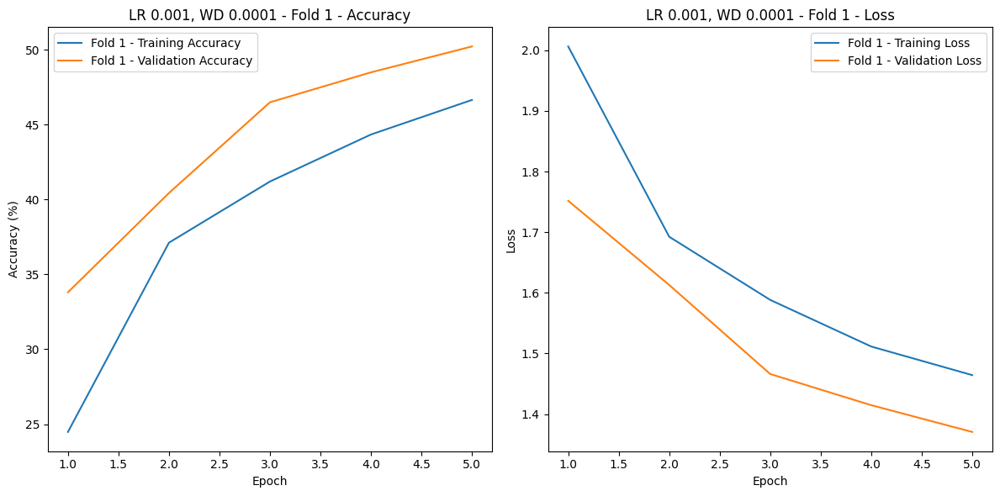

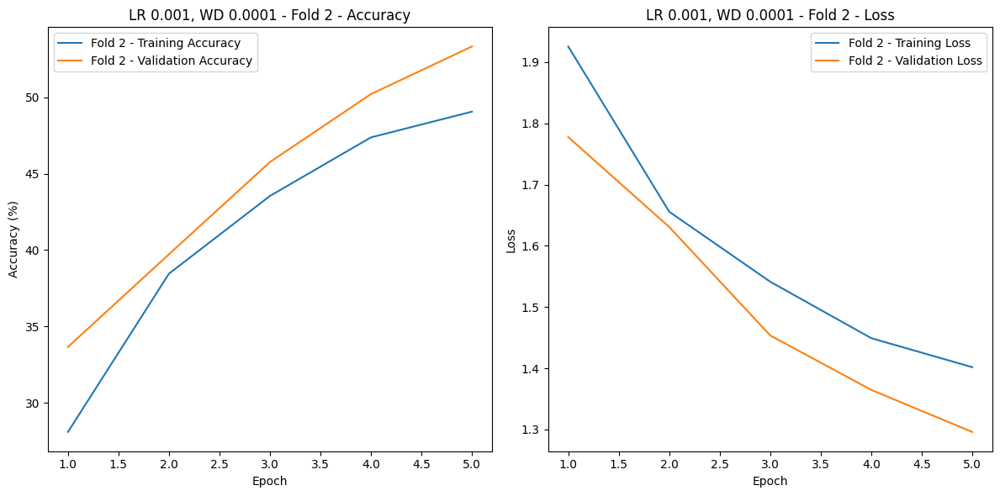

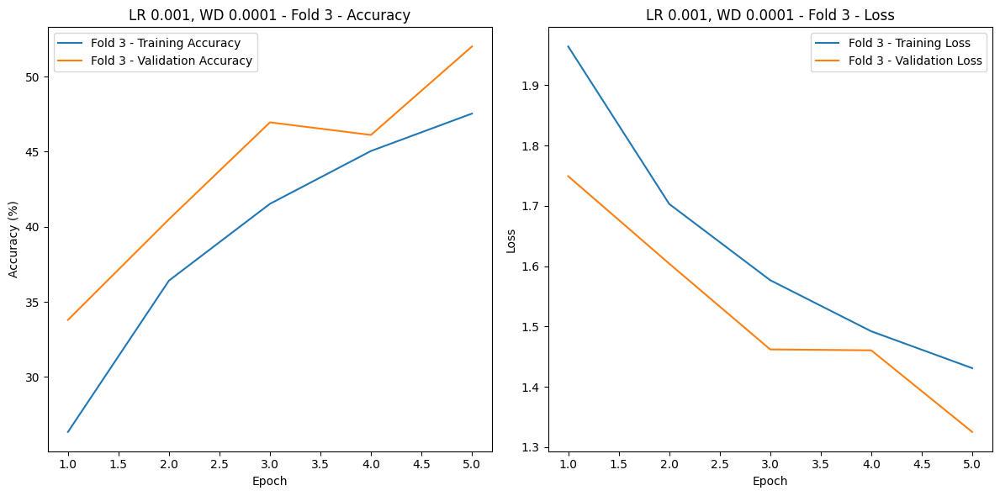

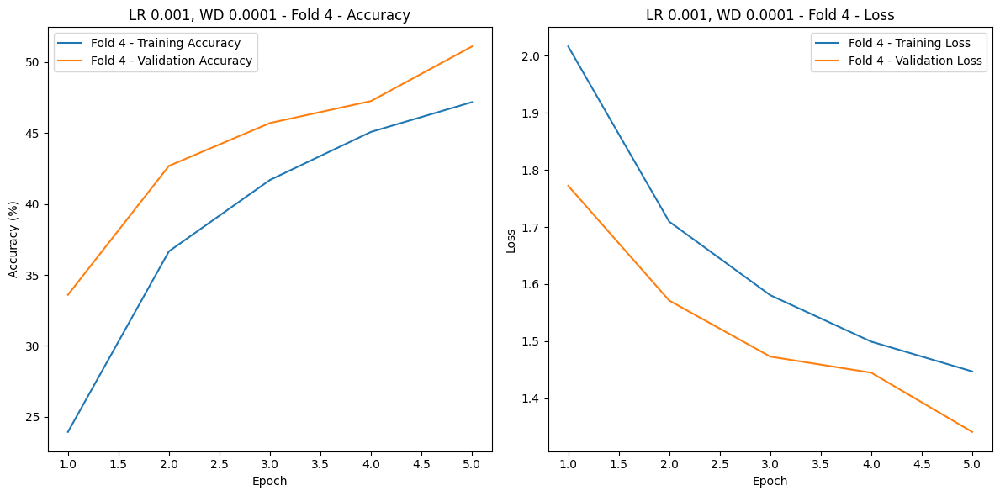

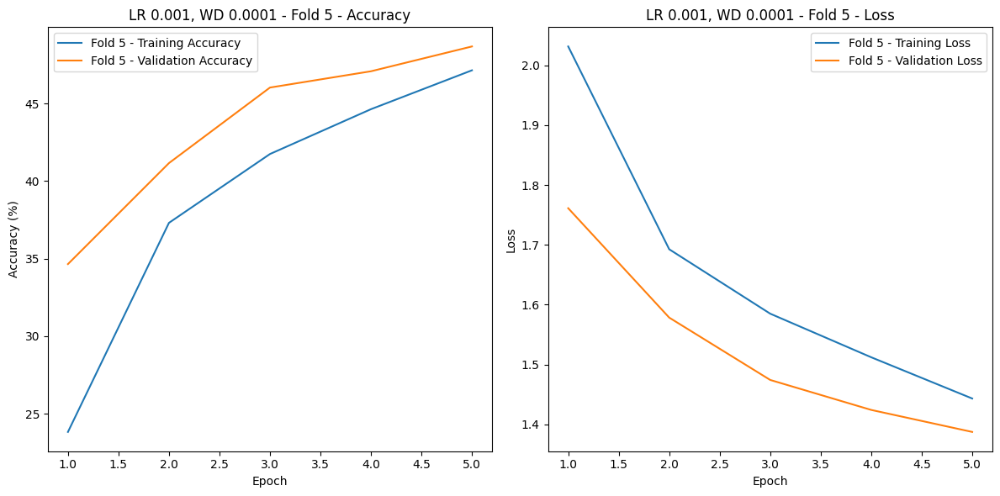

...

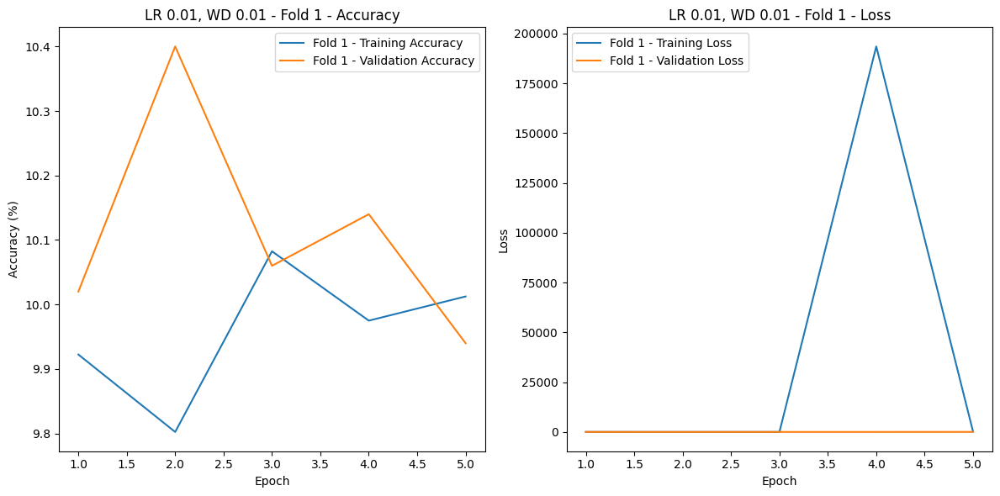

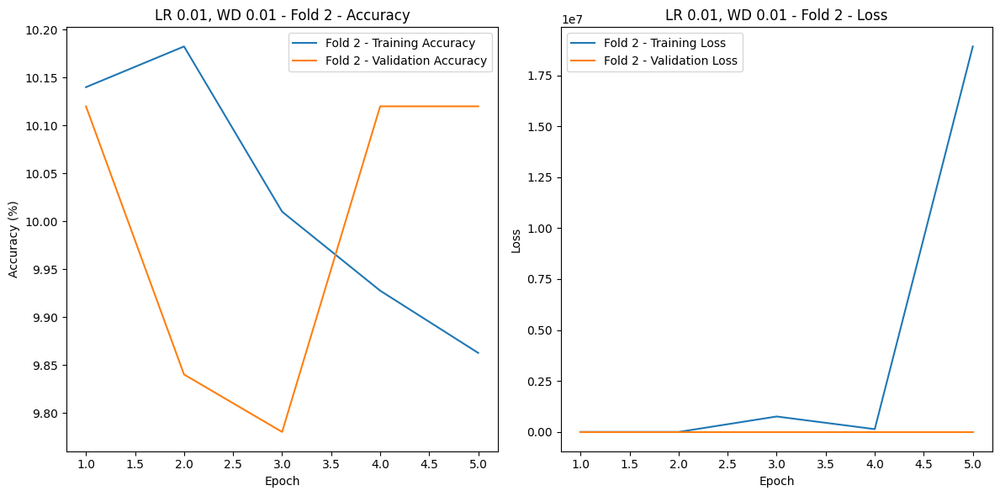

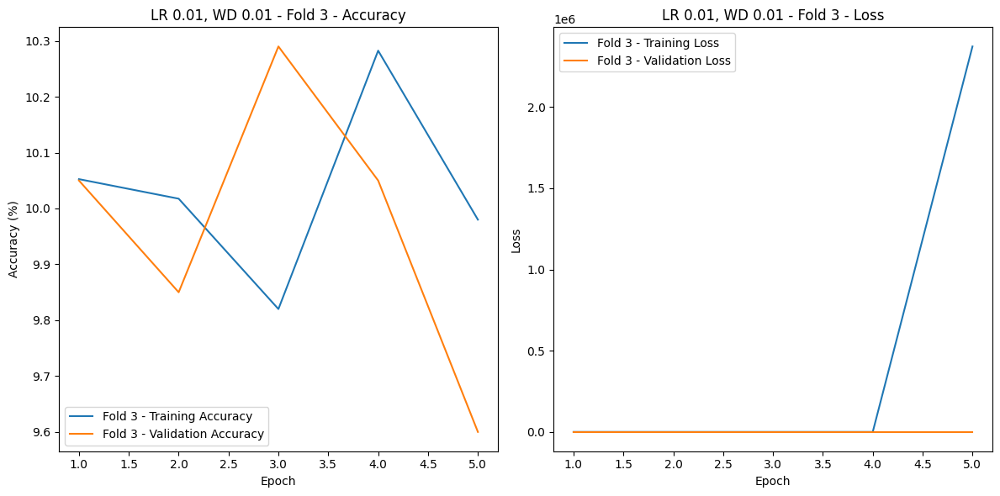

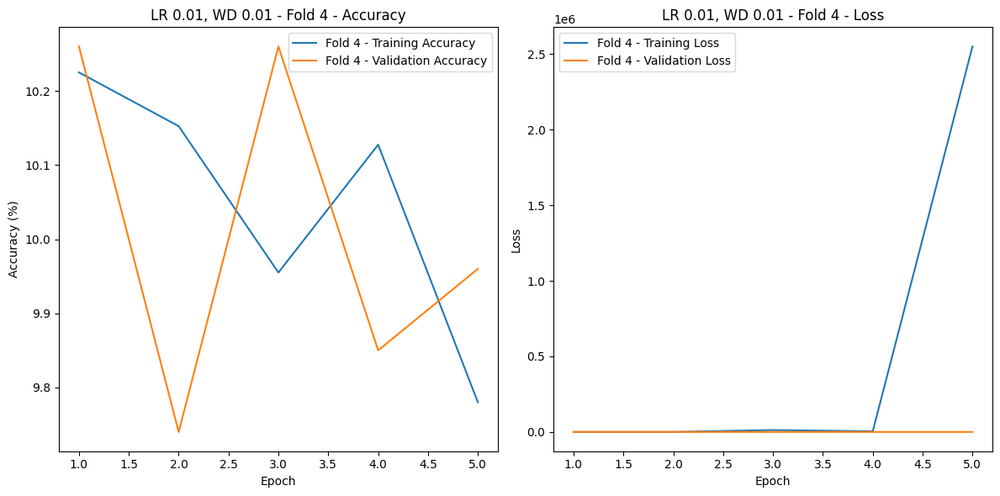

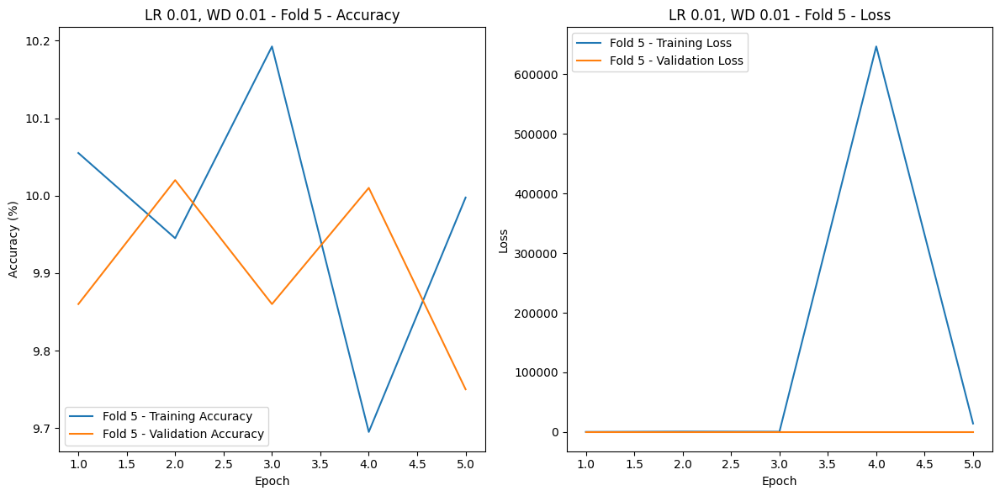

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)

k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]
weight_decays = [1e-4, 1e-3, 1e-2]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.alexnet(pretrained=False)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses, best_model_state


best_accuracy = 0
best_params = {}
best_model_path = 'best_alexnet_with_aug_l2_model.pth'
results = {}

for lr in learning_rates:
    for wd in weight_decays:
        print(f"\nTesting Learning Rate: {lr}, Weight Decay: {wd}")
        fold_accuracies = []

        for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
            print(f"Fold {fold+1}/{k_folds}")

            train_subset = Subset(dataset, train_idx)
            val_subset = Subset(dataset, val_idx)

            train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


            train_acc, val_acc, train_loss, val_loss, model_state = train_validate_model(train_loader, val_loader, lr, wd)
            fold_accuracies.append(np.mean(val_acc))


            results[(lr, wd, fold)] = {
                'train_accuracy': train_acc,
                'val_accuracy': val_acc,
                'train_loss': train_loss,
                'val_loss': val_loss,
            }

        avg_val_accuracy = np.mean(fold_accuracies)
        print(f"Average Validation Accuracy for Learning Rate {lr}, Weight Decay {wd}: {avg_val_accuracy:.2f}%\n")


        if avg_val_accuracy > best_accuracy:
            best_accuracy = avg_val_accuracy
            best_params = {'learning_rate': lr, 'weight_decay': wd}
            torch.save(model_state, best_model_path)
            print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}, Weight Decay: {best_params['weight_decay']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")



import matplotlib.pyplot as plt


for (lr, wd, fold), metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label=f'Fold {fold+1} - Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label=f'Fold {fold+1} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'LR {lr}, WD {wd} - Fold {fold+1} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label=f'Fold {fold+1} - Training Loss')
    plt.plot(epochs, metrics['val_loss'], label=f'Fold {fold+1} - Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'LR {lr}, WD {wd} - Fold {fold+1} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Testing

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = 'best_alexnet_with_aug_l2_model.pth'
model = models.alexnet(pretrained=False)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()


def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1043/2116304067.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_p

Test Accuracy: 52.15%


In [ ]:
#Alexnet model without L2 and without data augmentation

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate):
    model = models.alexnet(pretrained=False)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train


        model.eval()
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")

    return best_model_state, best_val_accuracy

best_accuracy = 0
best_params = {}
best_model_path = 'best_alexnet_no_aug_no_l2_model.pth'

for lr in learning_rates:
    print(f"\nTesting Learning Rate: {lr}")
    fold_accuracies = []

    for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
        print(f"Fold {fold+1}/{k_folds}")


        train_subset = Subset(dataset, train_idx)
        val_subset = Subset(dataset, val_idx)


        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


        model_state, val_accuracy = train_validate_model(train_loader, val_loader, lr)
        fold_accuracies.append(val_accuracy)

        print(f"Fold {fold+1} - Validation Accuracy: {val_accuracy:.2f}%")

    avg_val_accuracy = np.mean(fold_accuracies)
    print(f"Average Validation Accuracy for Learning Rate {lr}: {avg_val_accuracy:.2f}%\n")


    if avg_val_accuracy > best_accuracy:
        best_accuracy = avg_val_accuracy
        best_params = {'learning_rate': lr}
        torch.save(model_state, best_model_path)
        print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")


Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001
Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 32.84%, Validation Accuracy: 46.36%
Epoch [2/5], Training Accuracy: 47.48%, Validation Accuracy: 51.55%
Epoch [3/5], Training Accuracy: 53.07%, Validation Accuracy: 54.40%
Epoch [4/5], Training Accuracy: 56.63%, Validation Accuracy: 59.79%
Epoch [5/5], Training Accuracy: 59.06%, Validation Accuracy: 60.93%
Fold 1 - Validation Accuracy: 60.93%
Fold 2/5
Epoch [1/5], Training Accuracy: 33.19%, Validation Accuracy: 45.46%
Epoch [2/5], Training Accuracy: 46.44%, Validation Accuracy: 50.71%
Epoch [3/5], Training Accuracy: 52.56%, Validation Accuracy: 56.58%
Epoch [4/5], Training Accuracy: 56.35%, Validation Accuracy: 59.29%
Epoch [5/5], Training Accuracy: 59.55%, Validation Accuracy: 60.85%
Fold 2 - Validation Accuracy: 60.85%
Fold 3/5
Epoch [1/5], Training Accuracy: 34.95%, Validation Accuracy: 46.30%
Epoch [2/5], Training Accuracy: 48.20%, Validation Accuracy: 53.19%
Epoch [3/5], Training Accuracy: 53.23%, Validation Accuracy: 56.09%
Epoch [4/5], Training Ac

In [ ]:
#Graphs

Using device: mps
Files already downloaded and verified

Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 32.72%, Validation Accuracy: 43.02%
Training Loss: 1.8114, Validation Loss: 1.5511
Epoch [2/5], Training Accuracy: 45.40%, Validation Accuracy: 50.63%
Training Loss: 1.4886, Validation Loss: 1.3406
Epoch [3/5], Training Accuracy: 50.97%, Validation Accuracy: 55.80%
Training Loss: 1.3663, Validation Loss: 1.2471
Epoch [4/5], Training Accuracy: 54.91%, Validation Accuracy: 53.13%
Training Loss: 1.2736, Validation Loss: 1.2903
Epoch [5/5], Training Accuracy: 56.65%, Validation Accuracy: 57.31%
Training Loss: 1.2143, Validation Loss: 1.2228

Fold 2/5
Epoch [1/5], Training Accuracy: 31.43%, Validation Accuracy: 42.10%
Training Loss: 1.8373, Validation Loss: 1.5213
Epoch [2/5], Training Accuracy: 44.11%, Validation Accuracy: 47.94%
Training Loss: 1.5284, Validation Loss: 1.4130
Epoch [3/5], Training Accuracy: 48.23%, Validation Accuracy: 50.87%
Training Loss: 1.4222, Validation Loss: 1.3573
Epoch [4/5], Training Accuracy: 51.28%, Validation Accuracy: 54.04%
Tr

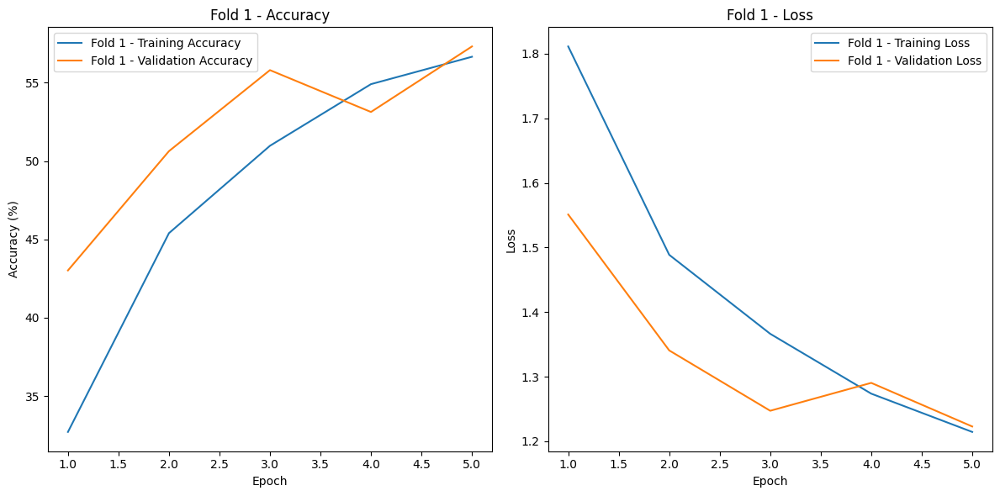

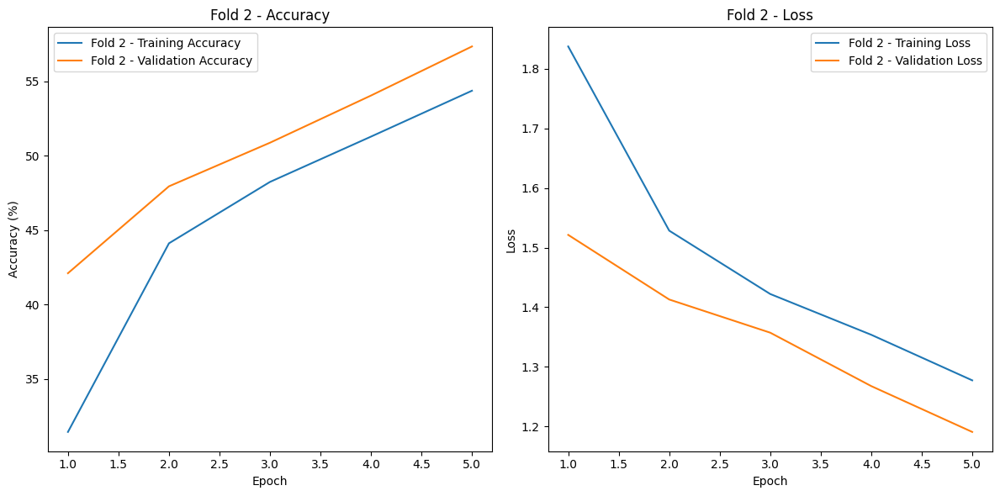

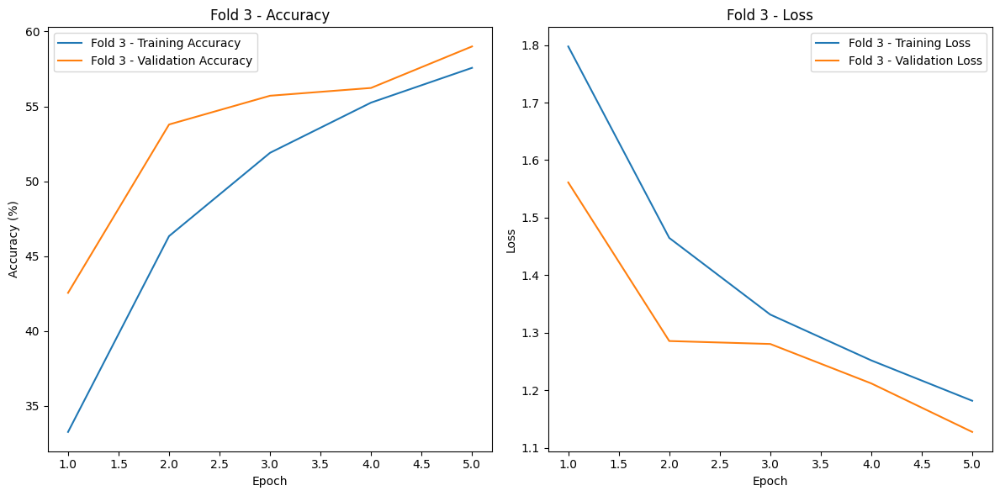

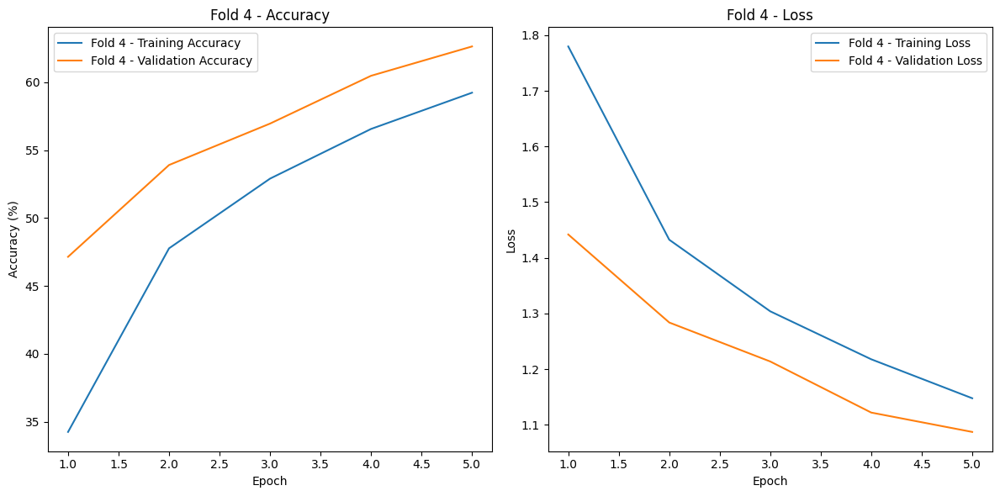

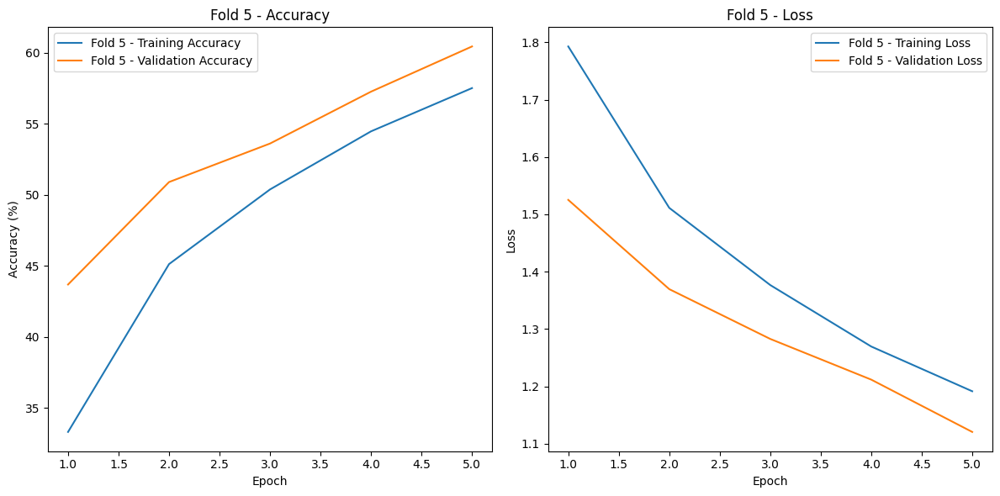

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rate = 0.001


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate):
    model = models.alexnet(pretrained=False)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses


results = {}

for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
    print(f"\nFold {fold+1}/{k_folds}")

    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)

    train_acc, val_acc, train_loss, val_loss = train_validate_model(train_loader, val_loader, learning_rate)


    results[fold] = {
        'train_accuracy': train_acc,
        'val_accuracy': val_acc,
        'train_loss': train_loss,
        'val_loss': val_loss,
    }


for fold, metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label=f'Fold {fold+1} - Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label=f'Fold {fold+1} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'Fold {fold+1} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label=f'Fold {fold+1} - Training Loss')
    plt.plot(epochs, metrics['val_loss'], label=f'Fold {fold+1} - Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold+1} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Testing

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = 'best_alexnet_no_aug_no_l2_model.pth'
model = models.alexnet(pretrained=False)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()


def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1043/187768611.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_pa

Test Accuracy: 60.41%


In [ ]:
#Mobilenet with L2 without data augmentation

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]
weight_decays = [1e-4, 1e-3, 1e-2]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.mobilenet_v2(pretrained=False)
    model.classifier[1] = nn.Linear(model.last_channel, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses, best_model_state


best_accuracy = 0
best_params = {}
best_model_path = 'best_mobilenet_no_aug_with_l2_model.pth'
results = {}

for lr in learning_rates:
    for wd in weight_decays:
        print(f"\nTesting Learning Rate: {lr}, Weight Decay: {wd}")
        fold_accuracies = []

        for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
            print(f"Fold {fold+1}/{k_folds}")

            train_subset = Subset(dataset, train_idx)
            val_subset = Subset(dataset, val_idx)

            train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


            train_acc, val_acc, train_loss, val_loss, model_state = train_validate_model(train_loader, val_loader, lr, wd)
            fold_accuracies.append(np.mean(val_acc))


            results[(lr, wd, fold)] = {
                'train_accuracy': train_acc,
                'val_accuracy': val_acc,
                'train_loss': train_loss,
                'val_loss': val_loss,
            }

        avg_val_accuracy = np.mean(fold_accuracies)
        print(f"Average Validation Accuracy for Learning Rate {lr}, Weight Decay {wd}: {avg_val_accuracy:.2f}%\n")


        if avg_val_accuracy > best_accuracy:
            best_accuracy = avg_val_accuracy
            best_params = {'learning_rate': lr, 'weight_decay': wd}
            torch.save(model_state, best_model_path)
            print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}, Weight Decay: {best_params['weight_decay']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")


Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001, Weight Decay: 0.0001
Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 48.30%, Validation Accuracy: 57.00%
Training Loss: 1.4140, Validation Loss: 1.2131
Epoch [2/5], Training Accuracy: 65.78%, Validation Accuracy: 70.38%
Training Loss: 0.9687, Validation Loss: 0.8466
Epoch [3/5], Training Accuracy: 74.05%, Validation Accuracy: 72.29%
Training Loss: 0.7479, Validation Loss: 0.7927
Epoch [4/5], Training Accuracy: 78.26%, Validation Accuracy: 76.78%
Training Loss: 0.6254, Validation Loss: 0.6649
Epoch [5/5], Training Accuracy: 81.33%, Validation Accuracy: 76.18%
Training Loss: 0.5447, Validation Loss: 0.7113
Fold 2/5
Epoch [1/5], Training Accuracy: 47.17%, Validation Accuracy: 56.88%
Training Loss: 1.4490, Validation Loss: 1.2152
Epoch [2/5], Training Accuracy: 65.32%, Validation Accuracy: 64.72%
Training Loss: 0.9891, Validation Loss: 0.9517
Epoch [3/5], Training Accuracy: 72.98%, Validation Accuracy: 74.31%
Training Loss: 0.7768, Validation Loss: 0.7252
Epoch [4/5], Training Accuracy: 77.86%, Validation Accuracy: 77.71%
Tra

In [ ]:
#Testing

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = 'best_mobilenet_no_aug_with_l2_model.pth'
model = models.mobilenet_v2(pretrained=False)
model.classifier[1] = nn.Linear(model.last_channel, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()


def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1003/1354203409.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_p

Test Accuracy: 78.79%


In [ ]:
#Mobilenet with L2 and with data Augmentation

Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001, Weight Decay: 0.0001
Fold 1/5
Epoch [1/5], Training Accuracy: 43.60%, Validation Accuracy: 53.49%
Training Loss: 1.5343, Validation Loss: 1.2783
Epoch [2/5], Training Accuracy: 61.06%, Validation Accuracy: 64.36%
Training Loss: 1.0899, Validation Loss: 1.0265
Epoch [3/5], Training Accuracy: 68.79%, Validation Accuracy: 71.03%
Training Loss: 0.8927, Validation Loss: 0.8443
Epoch [4/5], Training Accuracy: 73.52%, Validation Accuracy: 69.82%
Training Loss: 0.7599, Validation Loss: 0.8861
Epoch [5/5], Training Accuracy: 76.72%, Validation Accuracy: 77.06%
Training Loss: 0.6679, Validation Loss: 0.6619
Fold 2/5
Epoch [1/5], Training Accuracy: 41.58%, Validation Accuracy: 52.07%
Training Loss: 1.5840, Validation Loss: 1.3296
Epoch [2/5], Training Accuracy: 59.94%, Validation Accuracy: 64.15%
Training Loss: 1.1243, Validation Loss: 1.0285
Epoch [3/5], Training Accuracy: 68.59%, Validation Accuracy: 71.94%
T

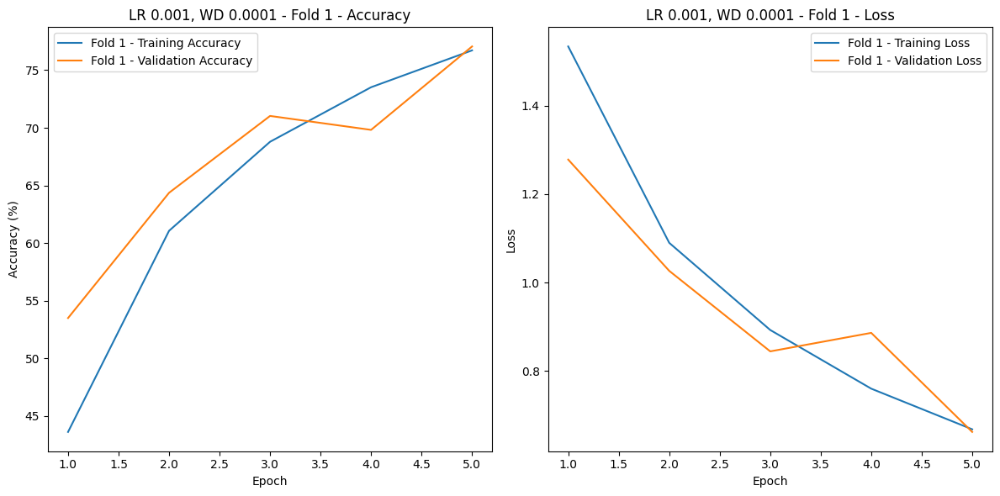

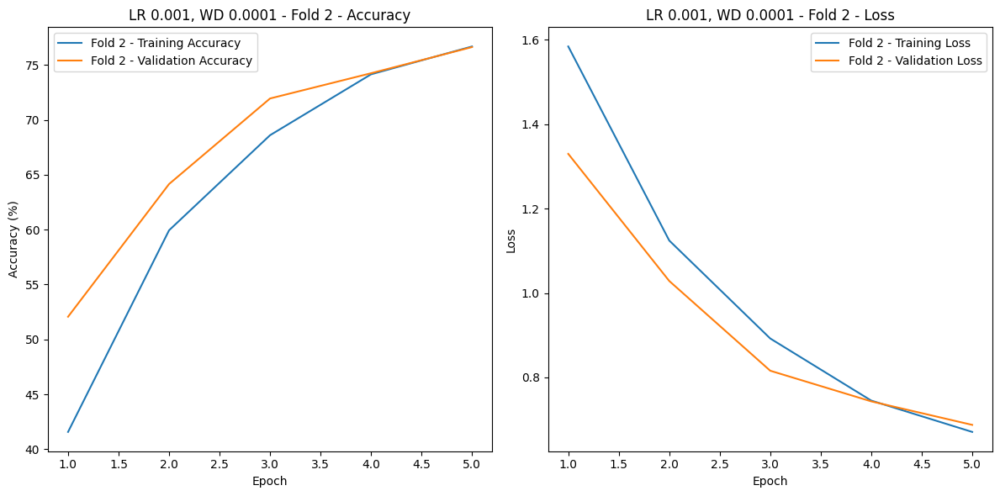

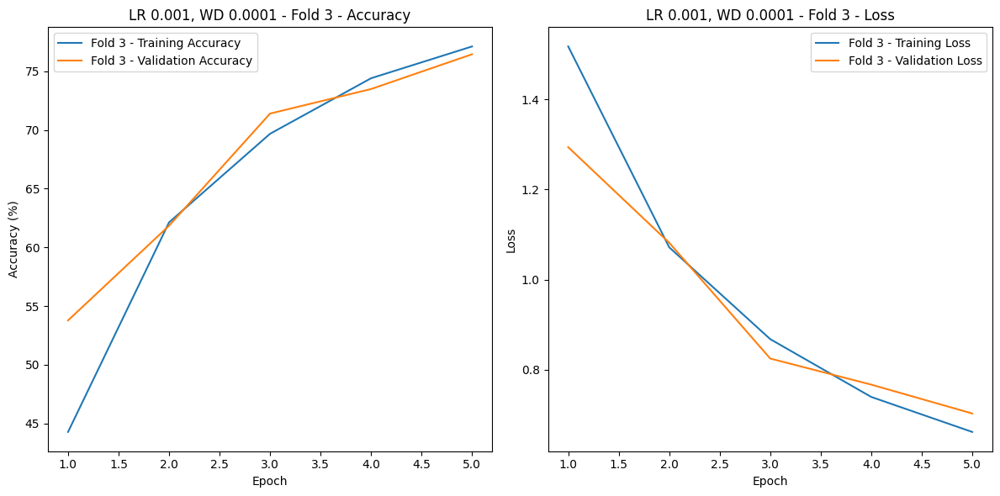

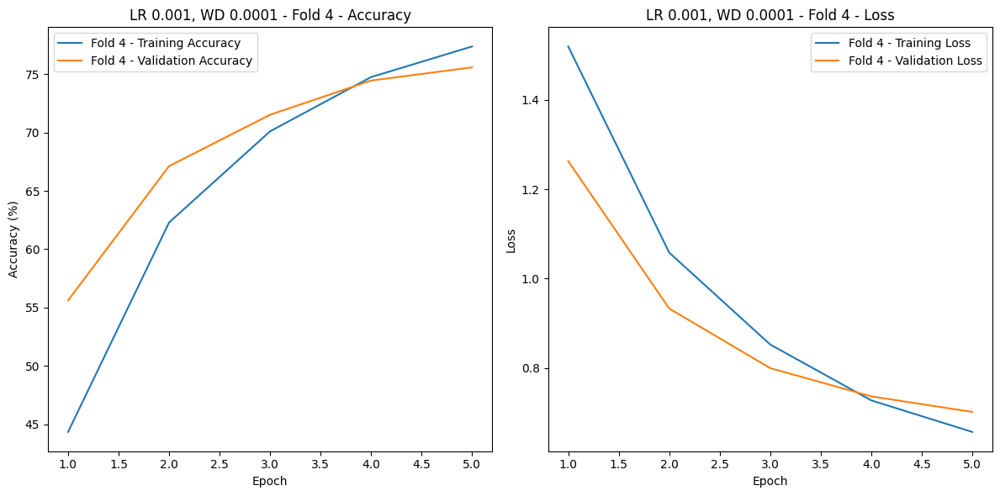

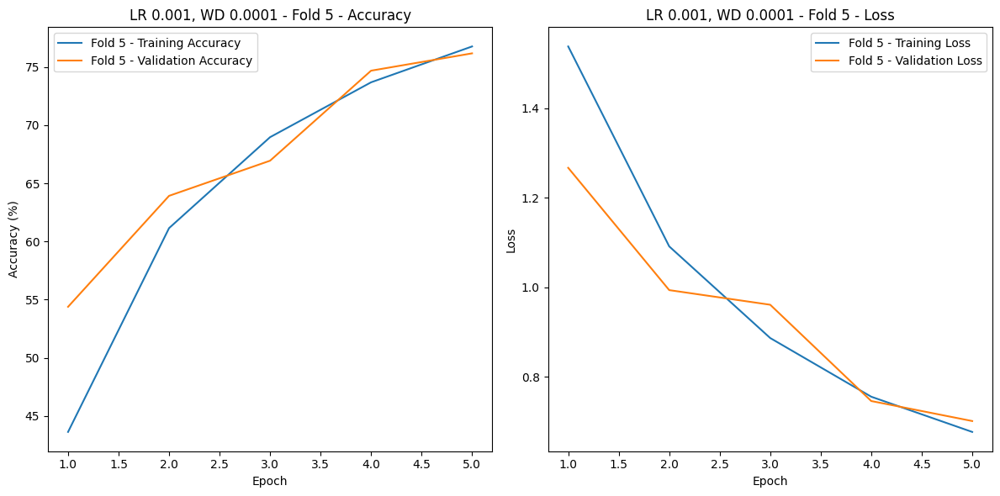

...

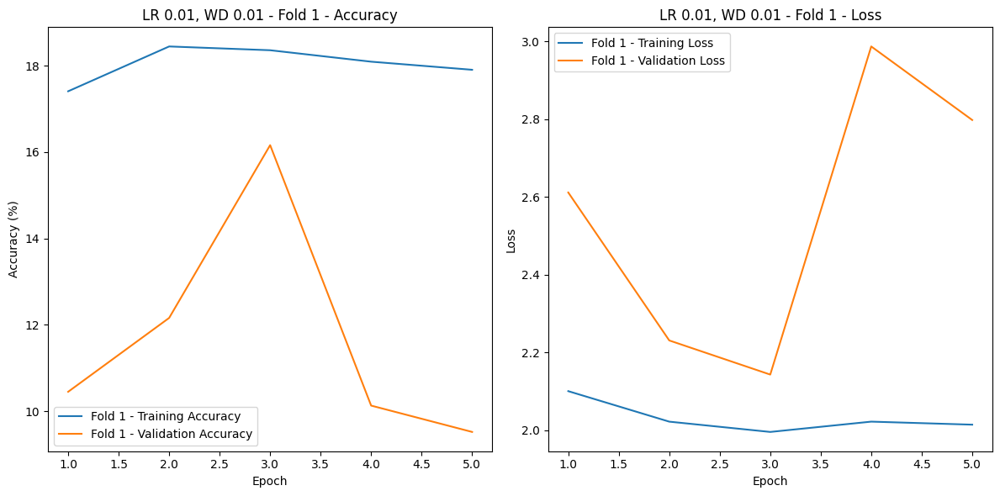

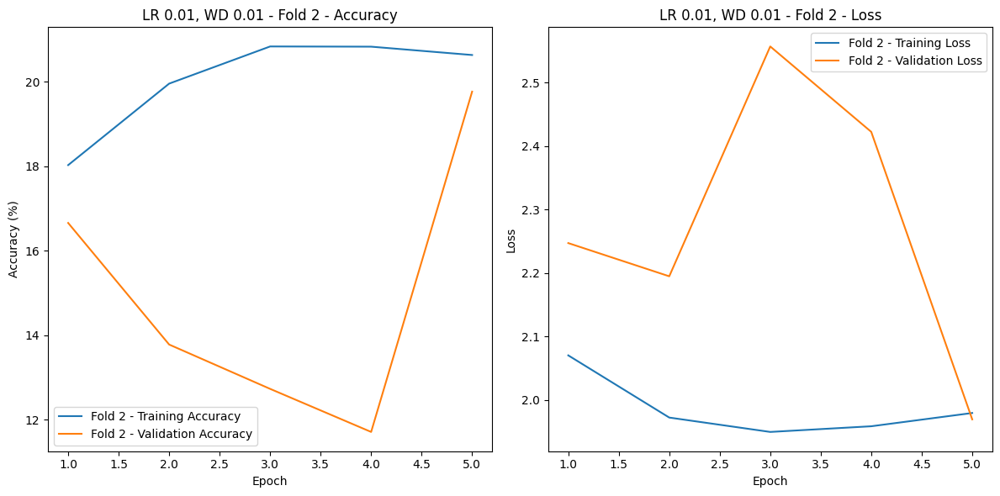

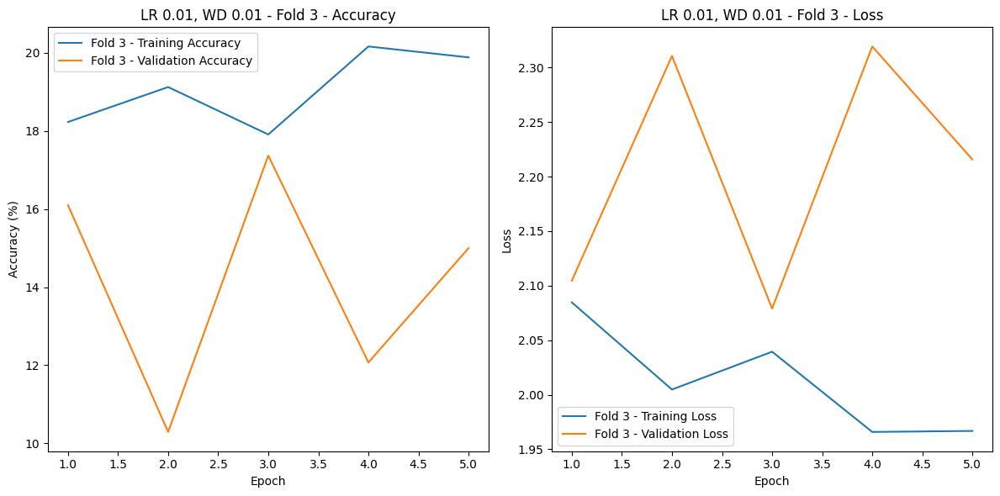

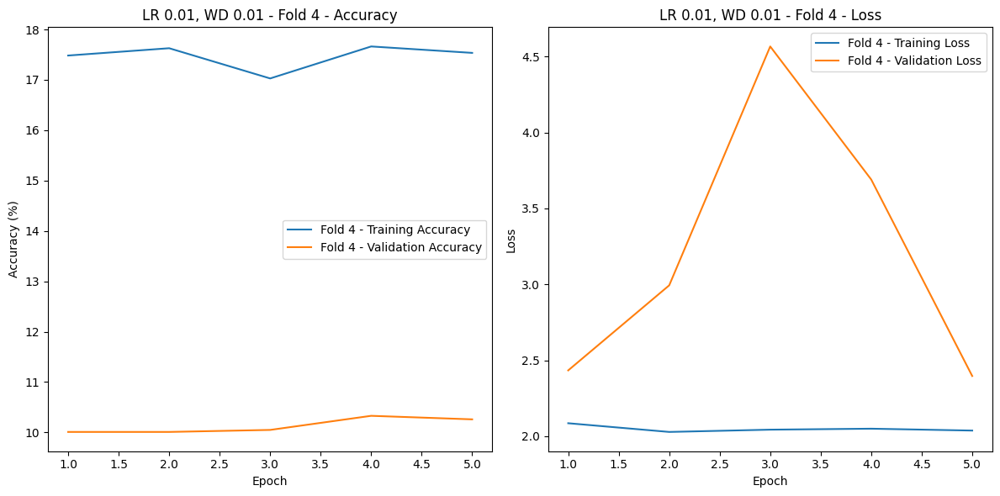

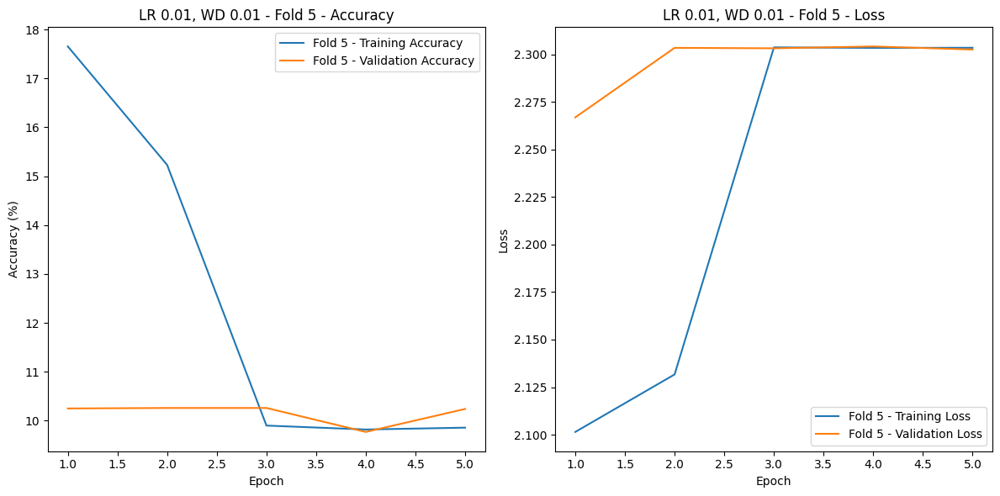

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]
weight_decays = [1e-4, 1e-3, 1e-2]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate, weight_decay):
    model = models.mobilenet_v2(pretrained=False)
    model.classifier[1] = nn.Linear(model.last_channel, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses, best_model_state


best_accuracy = 0
best_params = {}
best_model_path = 'best_mobilenet_with_aug_l2_model.pth'
results = {}

for lr in learning_rates:
    for wd in weight_decays:
        print(f"\nTesting Learning Rate: {lr}, Weight Decay: {wd}")
        fold_accuracies = []

        for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
            print(f"Fold {fold+1}/{k_folds}")

            train_subset = Subset(dataset, train_idx)
            val_subset = Subset(dataset, val_idx)

            train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


            train_acc, val_acc, train_loss, val_loss, model_state = train_validate_model(train_loader, val_loader, lr, wd)
            fold_accuracies.append(np.mean(val_acc))


            results[(lr, wd, fold)] = {
                'train_accuracy': train_acc,
                'val_accuracy': val_acc,
                'train_loss': train_loss,
                'val_loss': val_loss,
            }

        avg_val_accuracy = np.mean(fold_accuracies)
        print(f"Average Validation Accuracy for Learning Rate {lr}, Weight Decay {wd}: {avg_val_accuracy:.2f}%\n")


        if avg_val_accuracy > best_accuracy:
            best_accuracy = avg_val_accuracy
            best_params = {'learning_rate': lr, 'weight_decay': wd}
            torch.save(model_state, best_model_path)
            print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}, Weight Decay: {best_params['weight_decay']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")

import matplotlib.pyplot as plt


for (lr, wd, fold), metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label=f'Fold {fold+1} - Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label=f'Fold {fold+1} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'LR {lr}, WD {wd} - Fold {fold+1} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label=f'Fold {fold+1} - Training Loss')
    plt.plot(epochs, metrics['val_loss'], label=f'Fold {fold+1} - Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'LR {lr}, WD {wd} - Fold {fold+1} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Testing

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = 'best_mobilenet_with_aug_l2_model.pth'
model = models.mobilenet_v2(pretrained=False)
model.classifier[1] = nn.Linear(model.last_channel, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()


def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1038/3736855982.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future relea

Test Accuracy: 75.57%


In [ ]:
#Mobilenet without L2 and without data augmentation

Using device: mps
Files already downloaded and verified

Testing Learning Rate: 0.001
Fold 1/5


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/5], Training Accuracy: 47.39%, Validation Accuracy: 59.17%
Training Loss: 1.4342, Validation Loss: 1.1548
Epoch [2/5], Training Accuracy: 66.78%, Validation Accuracy: 65.99%
Training Loss: 0.9440, Validation Loss: 0.9630
Epoch [3/5], Training Accuracy: 73.86%, Validation Accuracy: 71.53%
Training Loss: 0.7423, Validation Loss: 0.8229
Epoch [4/5], Training Accuracy: 79.06%, Validation Accuracy: 77.60%
Training Loss: 0.6012, Validation Loss: 0.6549
Epoch [5/5], Training Accuracy: 82.06%, Validation Accuracy: 78.98%
Training Loss: 0.5148, Validation Loss: 0.6204
Fold 2/5
Epoch [1/5], Training Accuracy: 47.59%, Validation Accuracy: 59.03%
Training Loss: 1.4252, Validation Loss: 1.1532
Epoch [2/5], Training Accuracy: 66.45%, Validation Accuracy: 68.33%
Training Loss: 0.9474, Validation Loss: 0.9066
Epoch [3/5], Training Accuracy: 74.31%, Validation Accuracy: 70.97%
Training Loss: 0.7354, Validation Loss: 0.8314
Epoch [4/5], Training Accuracy: 79.03%, Validation Accuracy: 78.08%
Tra

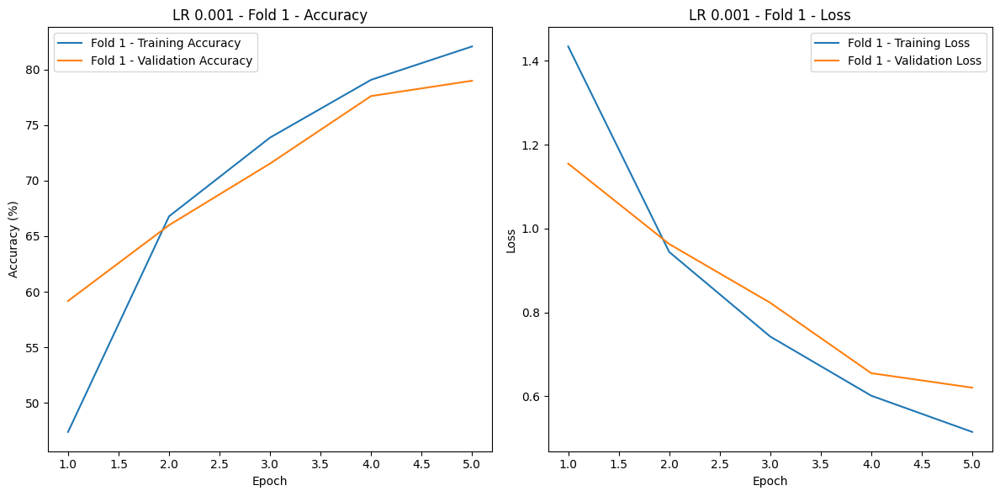

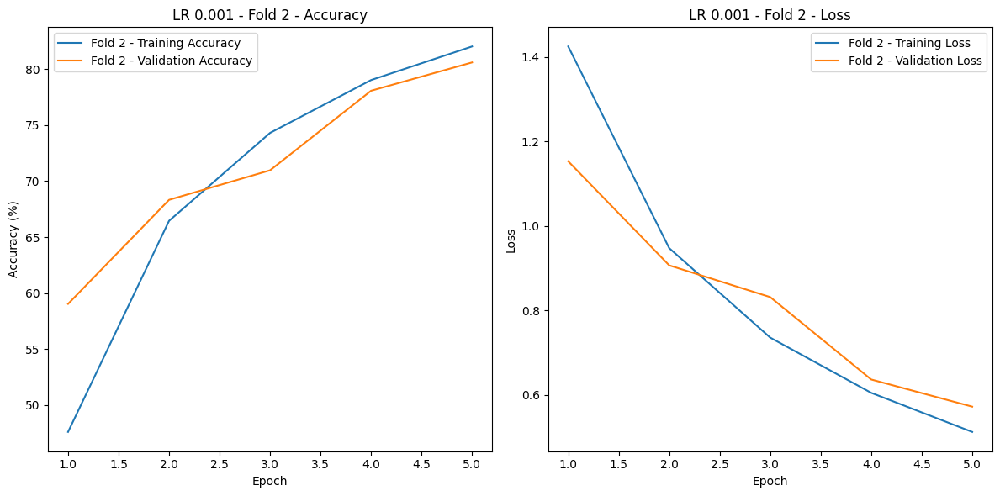

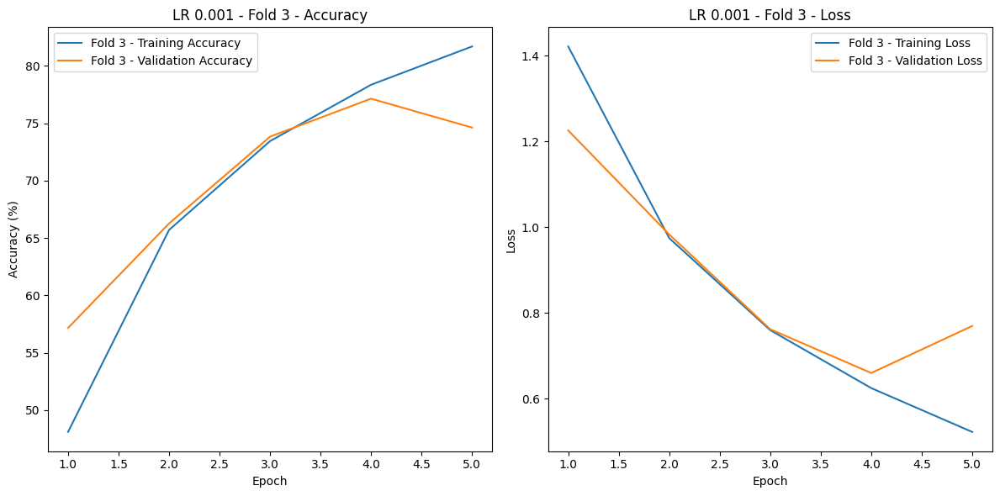

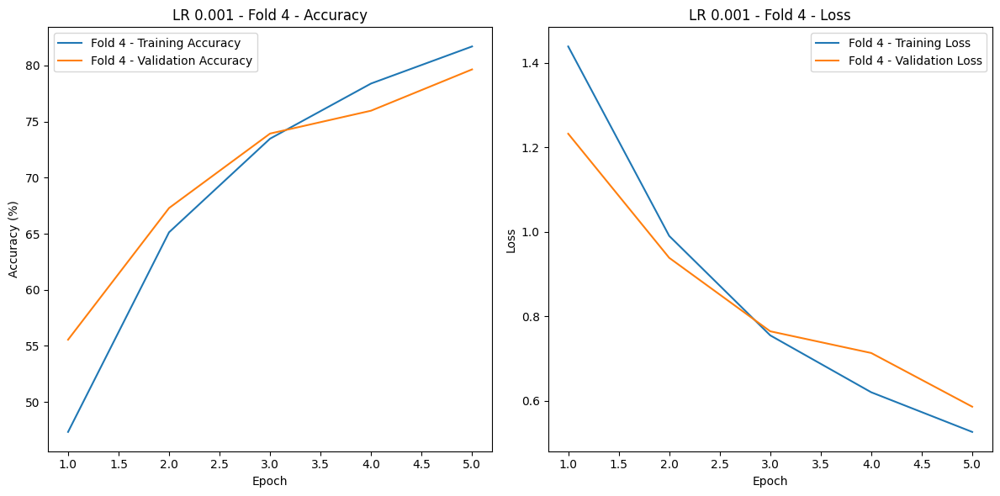

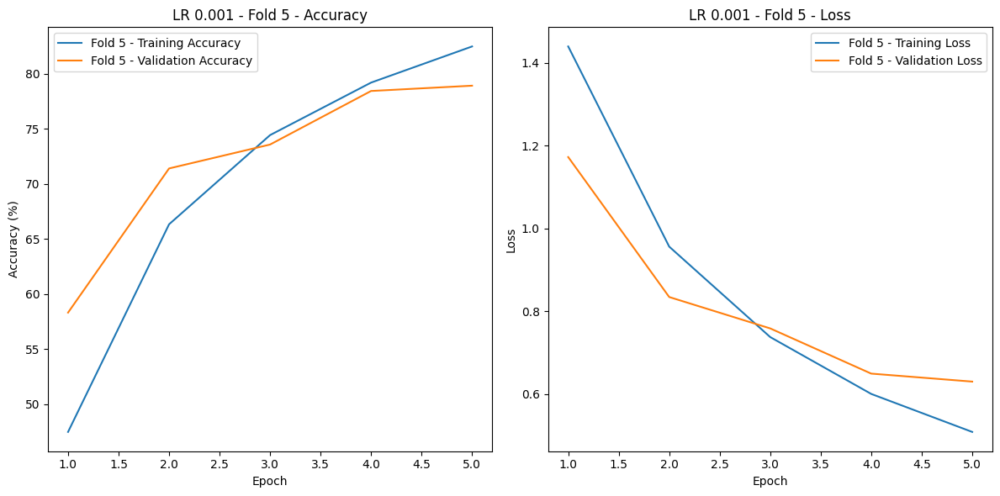

...

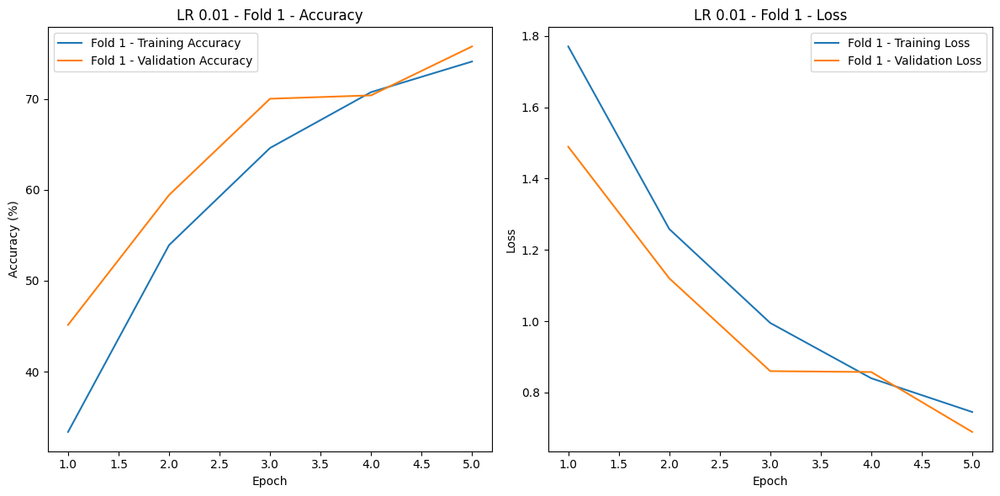

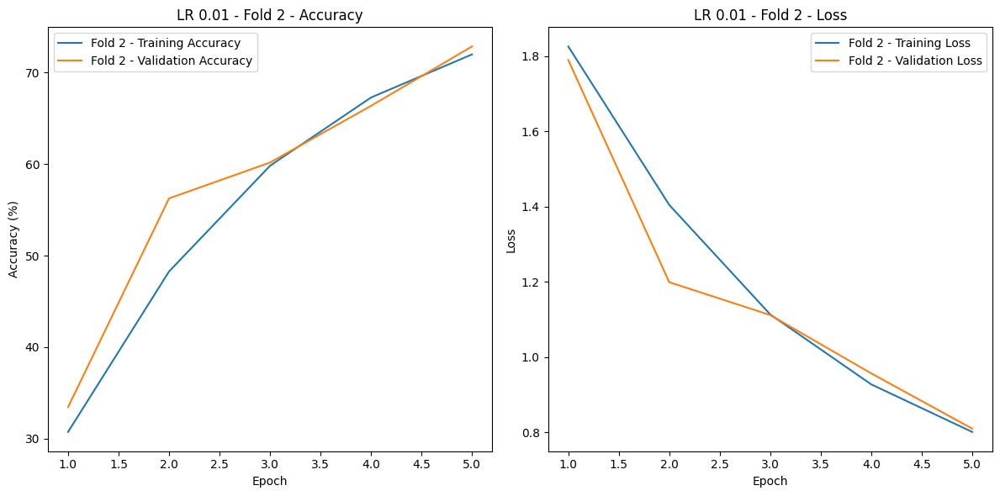

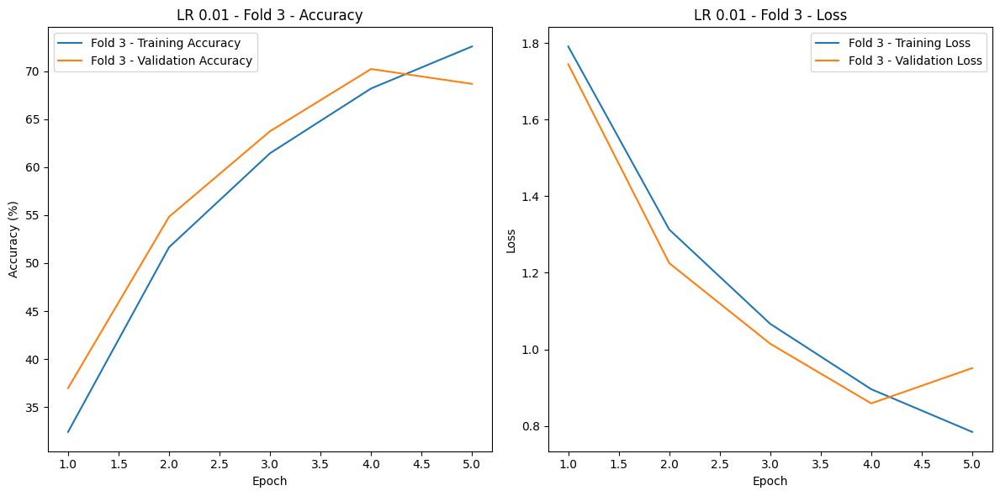

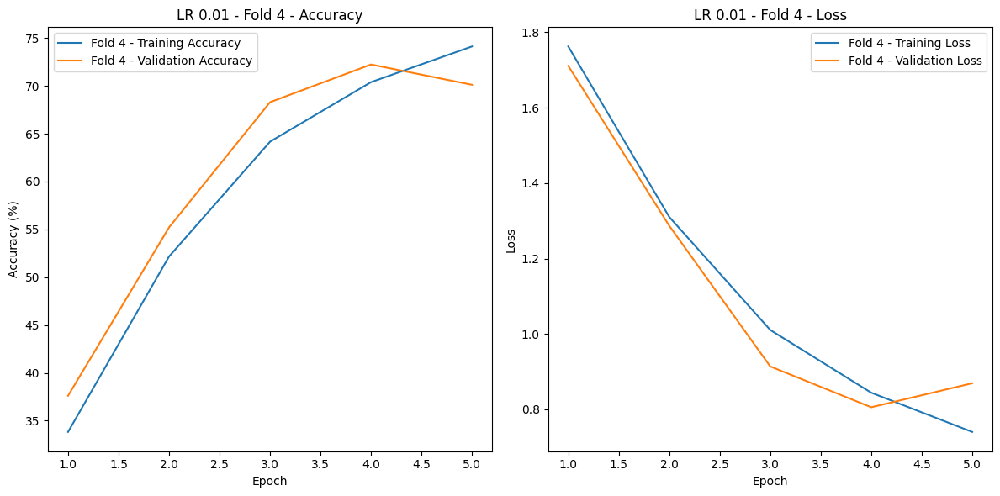

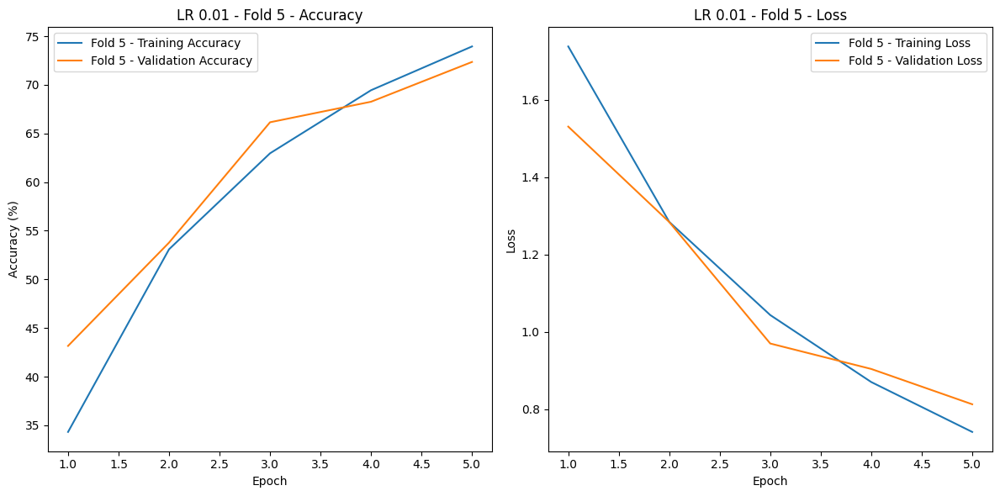

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import numpy as np


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


k_folds = 5
num_epochs = 5
batch_size = 64
learning_rates = [0.001, 0.005, 0.01]


kfold = KFold(n_splits=k_folds, shuffle=True)


def train_validate_model(train_loader, val_loader, learning_rate):
    model = models.mobilenet_v2(pretrained=False)
    model.classifier[1] = nn.Linear(model.last_channel, 10)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_accuracies, val_accuracies = [], []
    train_losses, val_losses = [], []

    best_model_state = None
    best_val_accuracy = 0

    for epoch in range(num_epochs):

        model.train()
        correct_train = 0
        total_train = 0
        running_loss_train = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss_train += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        train_loss = running_loss_train / len(train_loader)
        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)


        model.eval()
        correct_val = 0
        total_val = 0
        running_loss_val = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss_val += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_loss = running_loss_val / len(val_loader)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)


        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f"Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%")
        print(f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return train_accuracies, val_accuracies, train_losses, val_losses, best_model_state


best_accuracy = 0
best_params = {}
best_model_path = 'best_mobilenet_no_aug_no_l2_model.pth'
results = {}

for lr in learning_rates:
    print(f"\nTesting Learning Rate: {lr}")
    fold_accuracies = []

    for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
        print(f"Fold {fold+1}/{k_folds}")

        train_subset = Subset(dataset, train_idx)
        val_subset = Subset(dataset, val_idx)

        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2)


        train_acc, val_acc, train_loss, val_loss, model_state = train_validate_model(train_loader, val_loader, lr)
        fold_accuracies.append(np.mean(val_acc))


        results[(lr, fold)] = {
            'train_accuracy': train_acc,
            'val_accuracy': val_acc,
            'train_loss': train_loss,
            'val_loss': val_loss,
        }

    avg_val_accuracy = np.mean(fold_accuracies)
    print(f"Average Validation Accuracy for Learning Rate {lr}: {avg_val_accuracy:.2f}%\n")


    if avg_val_accuracy > best_accuracy:
        best_accuracy = avg_val_accuracy
        best_params = {'learning_rate': lr}
        torch.save(model_state, best_model_path)
        print(f"Best model saved with average validation accuracy: {best_accuracy:.2f}%")

print(f"\nBest Hyperparameters - Learning Rate: {best_params['learning_rate']}")
print(f"Best Average Validation Accuracy: {best_accuracy:.2f}%")


import matplotlib.pyplot as plt


for (lr, fold), metrics in results.items():
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_accuracy'], label=f'Fold {fold+1} - Training Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label=f'Fold {fold+1} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title(f'LR {lr} - Fold {fold+1} - Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_loss'], label=f'Fold {fold+1} - Training Loss')
    plt.plot(epochs, metrics['val_loss'], label=f'Fold {fold+1} - Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'LR {lr} - Fold {fold+1} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
#Testing

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader


device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")


transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


best_model_path = 'best_mobilenet_no_aug_no_l2_model.pth'
model = models.mobilenet_v2(pretrained=False)
model.classifier[1] = nn.Linear(model.last_channel, 10)
model.load_state_dict(torch.load(best_model_path))
model = model.to(device)
model.eval()


def evaluate_test_data(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = 100 * correct / total
    return test_accuracy


test_accuracy = evaluate_test_data(model, test_loader)
print(f'Test Accuracy: {test_accuracy:.2f}%')


Using device: mps
Files already downloaded and verified


/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/eshrakahmed/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/var/folders/t3/x0kqr0jx5yn13rwr16hsh4m00000gn/T/ipykernel_1204/3619393602.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future relea

Test Accuracy: 78.17%
